### 自動

In [ ]:
import requests
import pandas as pd
import numpy as np
import warnings
import datetime
warnings.filterwarnings('ignore')
# ============上市股票df============
url = "https://isin.twse.com.tw/isin/class_main.jsp?owncode=&stockname=&isincode=&market=1&issuetype=1&industry_code=&Page=1&chklike=Y"
response = requests.get(url)
listed = pd.read_html(response.text)[0]
listed.columns = listed.iloc[0,:]
listed = listed[["有價證券代號","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]]
listed = listed.iloc[1:]

# ============上櫃股票df============
urlTWO = "https://isin.twse.com.tw/isin/class_main.jsp?owncode=&stockname=&isincode=&market=2&issuetype=&industry_code=&Page=1&chklike=Y"
response = requests.get(urlTWO)
listedTWO = pd.read_html(response.text)[0]
listedTWO.columns = listedTWO.iloc[0,:]
listedTWO = listedTWO.loc[listedTWO['有價證券別'] == '股票']
listedTWO = listedTWO[["有價證券代號","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]]

# ============上市股票代號+.TW============
stock_1 = listed["有價證券代號"]
stock_num = stock_1.apply(lambda x: str(x) + ".TW")
stock_num.loc[len(stock_num)+1] = '0050.TW'
stock_num.loc[len(stock_num)+1] = '^TWII'
# print(stock_num)

# ============上櫃股票代號+.TWO============
stock_2 = listedTWO["有價證券代號"]
stock_num2 = stock_2.apply(lambda x: str(x) + ".TWO")
# print(stock_num2)

# ============concate全部股票代號============
stock_num = pd.concat([stock_num, stock_num2], ignore_index=True)
# print(stock_num)
allstock_info = pd.concat([listed, listedTWO], ignore_index=True)
allstock_info.columns = ["ID","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]
allstock_info.set_index('ID', inplace = True)
print(allstock_info)


In [ ]:
time_range_list = [['2023-10-31', '2023-11-10'], ['2023-11-14', '2023-11-24'], ['2023-11-27', '2023-12-04'], 
                   ['2023-12-21', '2024-01-02'], ['2024-01-05', '2024-01-17'], ['2024-01-18', '2024-02-22'], 
                   ['2024-02-29', '2024-03-06'], ['2024-03-26', '2024-04-09'], ['2024-04-23', '2024-05-09'], 
                   ['2024-05-14', '2024-05-31'], ['2024-06-11', '2024-06-21'], ['2024-06-27', '2024-07-09'], 
                   ['2024-07-29', '2024-08-02'], ['2024-08-06', '2024-08-28'], ['2024-09-11', '2024-09-30'], 
                   ['2024-10-16', '2024-10-24'], ['2024-11-04', '2024-11-12'], ['2024-11-18', '2024-11-27'], 
                   ['2024-11-28', '2024-12-09'], ['2024-03-15', '2024-04-09'], ['2024-08-13', '2024-08-26'],
                   ['2025-01-03', '2025-01-09'], ['2025-01-15', '2025-01-22'], ['2024-08-06', '2024-08-28']]

In [ ]:
time_range = time_range_list[-2]
start_time = time_range[0]
end_time = time_range[1]
bias_range = 3

In [ ]:
import pandas as pd
path = fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{start_time}_with_template.xlsx'
df_origin = pd.read_excel(path)
df = df_origin.loc[df_origin['ERS_rate_20'] > 80]
df = df.loc[df['ERS_rate_50'] > 80]
df = df.loc[df['ERS_rate_250'] > 80]


df = df.loc[df['year high sort'] == True]
df = df.loc[df['year low sort'] == True]
df = df.loc[df['Volume 50MA>250k'] == True]
df = df.loc[df['business volume(億)'] > 3]

# df = df.loc[df['STD_7'] > 3]
# df = df.loc[df['STD_7'] < df['STD_7_7MA']]
# df['volume decrease'] = df['Volume'] < df['Volume_5MA']

# df['5MA_bias'] = abs(df['Adj Close'] / df['5MA'] - 1)*100
# df['10MA_bias'] = abs(df['Adj Close'] / df['10MA'] - 1)*100
# df['20MA_bias'] = abs(df['Adj Close'] / df['20MA'] - 1)*100
# df = df.loc[df['5MA_bias'] < bias_range]
# df = df.loc[df['10MA_bias'] < bias_range]
# df = df.loc[df['20MA_bias'] < 10]

# df['bigger_than_20MA'] = df['Adj Close']*0.97 > df['20MA']
# df = df.loc[df['bigger_than_20MA'] == True]




IDs = df['ID'].values
sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
print(sort_ID)
text = ''
for id in sort_ID:
    id = str(id)
    if allstock_info.loc[id, '市場別'] == '上櫃':
        text += f'TPEX:{id}\n'
    elif allstock_info.loc[id, '市場別'] == '上市':
        text += f'TWSE:{id}\n'
    # create and save to txt
print(len(sort_ID))
with open(f'C:/Users/User/Desktop/StockInfoHub/Stock_Data_Collector/tradingview觀察清單/{start_time}_Rebound Elite.txt', 'w', encoding='utf-8') as f:
    f.write(text)
print(f'{start_time}_Rebound Elite.txt saved')


In [ ]:
stock_data_path = fr'C:\Users\User\Desktop\stock\data_test'
win_times = 0
lose_times = 0
win_profits = []
lose_profits = []
max_profits = []
min_profits = []
spend_trade_days_list = [] 
for ID in IDs:
    stock_df = pd.read_csv(f'{stock_data_path}/{ID}.csv')
    stock_df = stock_df.loc[stock_df['Date'] > start_time]
    stock_df = stock_df.loc[stock_df['Date'] <= end_time]
    stock_df['Adj High'] = stock_df['Adj Close']/stock_df['Close']*stock_df['High']
    stock_df['Adj Low'] = stock_df['Adj Close']/stock_df['Close']*stock_df['Low']
    if stock_df.empty:
        continue
    trade_days = len(stock_df)
    stock_df.reset_index(drop=True, inplace=True)
    # max and min price and index of price drop bigger than 3.5% 
    # max_price = stock_df.loc[1:, 'Adj Close'].max()
    # min_price = stock_df['Adj Close'].min()
    buy_price = stock_df.loc[0, 'Adj Close']
    rolling_profit_rate = round((stock_df.loc[1:, 'Adj Close'] - buy_price)*100 / buy_price, 2)
    rolling_max_profit_rate = round((stock_df.loc[1:, 'Adj High'] - buy_price)*100 / buy_price, 2)
    rolling_min_profit_rate = round((stock_df.loc[1:, 'Adj Low'] - buy_price)*100 / buy_price, 2)
    max_max_profit_rate = rolling_max_profit_rate.max()
    min_min_profit_rate = rolling_min_profit_rate.min()
    max_profit_rate = rolling_profit_rate.max()
    min_profit_rate = rolling_profit_rate.min()
    ## index list of profit rate > 10% and < -3% 
    take_profit_index = rolling_max_profit_rate[rolling_max_profit_rate > 10].index
    max_profits.append(max_max_profit_rate)
    stop_loss_index = rolling_min_profit_rate[rolling_min_profit_rate < -3.5].index
    min_profits.append(min_min_profit_rate)
    if take_profit_index.empty:
        take_profit_index = stock_df.index[-1]
    else:
        take_profit_index = take_profit_index[0]
    if stop_loss_index.empty:
        stop_loss_index = stock_df.index[-1]
    else:
        stop_loss_index = stop_loss_index[0]
    take_profit_date = stock_df.loc[take_profit_index, 'Date']
    stop_loss_date = stock_df.loc[stop_loss_index, 'Date']

    if take_profit_index < stop_loss_index:
        profit = rolling_max_profit_rate.loc[take_profit_index]
        profit_date = take_profit_date
        win_or_lose = 'win'
    elif take_profit_index > stop_loss_index:
        profit = rolling_min_profit_rate.loc[stop_loss_index]
        profit_date = stop_loss_date
        win_or_lose = 'lose'
    else:
        profit = rolling_profit_rate.loc[stop_loss_index]
        profit_date = stop_loss_date
        win_or_lose = 'lose' if profit < 0 else 'win'
    if win_or_lose == 'win':
        win_times += 1
        win_profits.append(profit)
    else:
        lose_times += 1
        lose_profits.append(profit)
    spend_trade_days = datetime.datetime.strptime(profit_date, '%Y-%m-%d') - datetime.datetime.strptime(start_time, '%Y-%m-%d')
    spend_trade_days_list.append(spend_trade_days.days)
    print(f'{win_or_lose} | {ID} | max : {max_max_profit_rate}% | min : {min_min_profit_rate}% | profit: {profit}% | take profit date: {profit_date} | spend days: {spend_trade_days.days} | buy date: {stock_df.loc[0, "Date"]}')

win_rate = round(win_times/(win_times+lose_times), 4)

capital = 500000
max_profit_multi = 4
min_profit_multi = 1.2
win_profits = list(map(lambda x: 12 if x > 12 else x, win_profits))
lose_profits = list(map(lambda x: -5 if x < -5 else x, lose_profits))
total_profit = sum(win_profits) + sum(lose_profits)
trade_times = win_times + lose_times
avg_profit = round((total_profit/100) / trade_times, 3)
avg_max_profit = round(sum(max_profits)/len(max_profits), 2)
avg_min_profit = round(sum(min_profits)/len(min_profits), 2)


In [ ]:
print(f'start time: {start_time} | end time: {end_time} | trade days: {trade_days} | avg trade days: {round(np.mean(spend_trade_days_list), 1)} | trade times: {trade_times}')
print(f'win times: {win_times} | lose times: {lose_times} | win rate: {win_rate*100}% | avg profit: {avg_profit*100}% | avg max profit: {avg_max_profit}% | avg min profit: {avg_min_profit}%')
print(f'avg win profits: {round(np.mean(win_profits), 2)}% | avg lose profits: {round(np.mean(lose_profits), 2)}% | win/lose ratio: {abs(round(np.mean(win_profits)/np.mean(lose_profits), 2))} | adj win/lose ratio: {abs((np.mean(win_profits)*win_rate)/(np.mean(lose_profits)*(1-win_rate)))}')
print(f'capital: {capital} | max profit(4X) : {capital*(1+max_profit_multi*avg_profit)}({(100*max_profit_multi*avg_profit)}%) | min profit(1.2X) : {capital*(min_profit_multi*avg_profit)}({(100*min_profit_multi*avg_profit)}%)')

### 近1年回測

In [ ]:
back_test_df = pd.DataFrame([], columns=['start_time', 'end_time', 'trade_days', 'avg_trade_days', 'trade_times', 'win_times', 'lose_times', 'win_rate', 'avg_profit', 'avg_max_profit', 'avg_min_profit', 'avg_win_profits', 'avg_lose_profits', 'win_lose_ratio', 'adj_win_lose_ratio', 'capital', 'max_profit', 'min_profit'])

# time_range_list = [['2023-10-31', '2023-11-10'], ['2023-11-14', '2023-11-24'], ['2023-11-27', '2023-12-04'], 
#                    ['2023-12-21', '2024-01-02'], ['2024-01-05', '2024-01-17'], ['2024-01-18', '2024-02-22'], 
#                    ['2024-02-29', '2024-03-06'], ['2024-03-15', '2024-04-09'], ['2024-04-23', '2024-05-09'], 
#                    ['2024-05-14', '2024-05-31'], ['2024-06-11', '2024-06-21'], ['2024-06-27', '2024-07-09'], 
#                    ['2024-07-29', '2024-08-02'], ['2024-08-06', '2024-08-28'], ['2024-09-11', '2024-09-30'], 
#                    ['2024-10-16', '2024-10-24'], ['2024-11-04', '2024-11-12'], ['2024-11-18', '2024-11-27'], 
#                    ['2024-11-28', '2024-12-09'], ]
time_range_list = [['2023-11-01', '2023-11-10'], ['2023-11-15', '2023-11-24'], ['2023-11-28', '2023-12-04'], 
                   ['2023-12-22', '2024-01-02'], ['2024-01-08', '2024-01-17'], ['2024-01-19', '2024-02-22'], 
                   ['2024-03-01', '2024-03-06'], ['2024-03-18', '2024-04-09'], ['2024-04-24', '2024-05-09'], 
                   ['2024-05-15', '2024-05-31'], ['2024-06-12', '2024-06-21'], ['2024-07-01', '2024-07-09'], 
                   ['2024-07-30', '2024-08-02'], ['2024-08-07', '2024-08-28'], ['2024-09-12', '2024-09-30'], 
                   ['2024-10-17', '2024-10-24'], ['2024-11-07', '2024-11-12'], ['2024-11-21', '2024-11-27'], 
                   ['2024-11-29', '2024-12-09'], ]
for time_range in time_range_list:
    start_time = time_range[0]
    end_time = time_range[1]
    bias_range = 3
    path = fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{start_time}_with_template.xlsx'
    df_origin = pd.read_excel(path)
    df = df_origin.loc[df_origin['ERS_rate_20'] > 80]
    df = df.loc[df['ERS_rate_50'] > 80]
    df = df.loc[df['ERS_rate_250'] > 80]
    df = df.loc[df['year high sort'] == True]
    df = df.loc[df['year low sort'] == True]
    df = df.loc[df['Volume 50MA>250k'] == True]
    df = df.loc[df['business volume(億)'] > 3]

    # df = df.loc[df['STD_7'] > 3]
    # df = df.loc[df['STD_7'] < df['STD_7_7MA']]
    # df['volume decrease'] = df['Volume'] < df['Volume_5MA']

    # df['5MA_bias'] = abs(df['Adj Close'] / df['5MA'] - 1)*100
    # df['10MA_bias'] = abs(df['Adj Close'] / df['10MA'] - 1)*100
    # df['20MA_bias'] = abs(df['Adj Close'] / df['20MA'] - 1)*100
    # df = df.loc[df['5MA_bias'] < bias_range]
    # df = df.loc[df['10MA_bias'] < bias_range]
    # df = df.loc[df['20MA_bias'] < 10]

    # df['bigger_than_20MA'] = df['Adj Close']*0.97 > df['20MA']
    # df = df.loc[df['bigger_than_20MA'] == True]




    IDs = df['ID'].values
    sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
    print(sort_ID)
    text = ''
    for id in sort_ID:
        id = str(id)
        if allstock_info.loc[id, '市場別'] == '上櫃':
            text += f'TPEX:{id}\n'
        elif allstock_info.loc[id, '市場別'] == '上市':
            text += f'TWSE:{id}\n'
        # create and save to txt
    print(len(sort_ID))
    with open(f'C:/Users/User/Desktop/StockInfoHub/Stock_Data_Collector/tradingview觀察清單/{start_time}_Rebound Elite.txt', 'w', encoding='utf-8') as f:
        f.write(text)
    print(f'{start_time}_Rebound Elite.txt saved')


    stock_data_path = fr'C:\Users\User\Desktop\stock\data_test'
    win_times = 0
    lose_times = 0
    win_profits = []
    lose_profits = []
    max_profits = []
    min_profits = []
    spend_trade_days_list = [] 
    for ID in IDs:
        stock_df = pd.read_csv(f'{stock_data_path}/{ID}.csv')
        stock_df = stock_df.loc[stock_df['Date'] > start_time]
        stock_df = stock_df.loc[stock_df['Date'] <= end_time]
        stock_df['Adj High'] = stock_df['Adj Close']/stock_df['Close']*stock_df['High']
        stock_df['Adj Low'] = stock_df['Adj Close']/stock_df['Close']*stock_df['Low']
        if stock_df.empty:
            continue
        trade_days = len(stock_df)
        stock_df.reset_index(drop=True, inplace=True)
        # max and min price and index of price drop bigger than 3.5% 
        # max_price = stock_df.loc[1:, 'Adj Close'].max()
        # min_price = stock_df['Adj Close'].min()
        buy_price = stock_df.loc[0, 'Adj Close']
        rolling_profit_rate = round((stock_df.loc[1:, 'Adj Close'] - buy_price)*100 / buy_price, 2)
        rolling_max_profit_rate = round((stock_df.loc[1:, 'Adj High'] - buy_price)*100 / buy_price, 2)
        rolling_min_profit_rate = round((stock_df.loc[1:, 'Adj Low'] - buy_price)*100 / buy_price, 2)
        max_max_profit_rate = rolling_max_profit_rate.max()
        min_min_profit_rate = rolling_min_profit_rate.min()
        max_profit_rate = rolling_profit_rate.max()
        min_profit_rate = rolling_profit_rate.min()
        ## index list of profit rate > 10% and < -3% 
        take_profit_index = rolling_max_profit_rate[rolling_max_profit_rate > 10].index
        max_profits.append(max_max_profit_rate)
        stop_loss_index = rolling_min_profit_rate[rolling_min_profit_rate < -3.5].index
        min_profits.append(min_min_profit_rate)
        if take_profit_index.empty:
            take_profit_index = stock_df.index[-1]
        else:
            take_profit_index = take_profit_index[0]
        if stop_loss_index.empty:
            stop_loss_index = stock_df.index[-1]
        else:
            stop_loss_index = stop_loss_index[0]
        take_profit_date = stock_df.loc[take_profit_index, 'Date']
        stop_loss_date = stock_df.loc[stop_loss_index, 'Date']

        if take_profit_index < stop_loss_index:
            profit = rolling_max_profit_rate.loc[take_profit_index]
            profit_date = take_profit_date
            win_or_lose = 'win'
        elif take_profit_index > stop_loss_index:
            profit = rolling_min_profit_rate.loc[stop_loss_index]
            profit_date = stop_loss_date
            win_or_lose = 'lose'
        else:
            profit = rolling_profit_rate.loc[stop_loss_index]
            profit_date = stop_loss_date
            win_or_lose = 'lose' if profit < 0 else 'win'
        if win_or_lose == 'win':
            win_times += 1
            win_profits.append(profit)
        else:
            lose_times += 1
            lose_profits.append(profit)
        spend_trade_days = datetime.datetime.strptime(profit_date, '%Y-%m-%d') - datetime.datetime.strptime(start_time, '%Y-%m-%d')
        spend_trade_days_list.append(spend_trade_days.days)
        # print(f'{win_or_lose} | {ID} | max : {max_max_profit_rate}% | min : {min_min_profit_rate}% | profit: {profit}% | take profit date: {profit_date} | spend days: {spend_trade_days.days} | buy date: {stock_df.loc[0, "Date"]}')

    win_rate = round(win_times/(win_times+lose_times), 4)
    capital = 500000
    max_profit_multi = 4
    min_profit_multi = 1.2
    win_profits = list(map(lambda x: 12 if x > 12 else x, win_profits))
    lose_profits = list(map(lambda x: -5 if x < -5 else x, lose_profits))
    total_profit = sum(win_profits) + sum(lose_profits)
    trade_times = win_times + lose_times
    avg_profit = round((total_profit/100) / trade_times, 3)
    avg_max_profit = round(sum(max_profits)/len(max_profits), 2)
    avg_min_profit = round(sum(min_profits)/len(min_profits), 2)

    print(f'start time: {start_time} | end time: {end_time} | trade days: {trade_days} | avg trade days: {round(np.mean(spend_trade_days_list), 1)} | trade times: {trade_times}')
    print(f'win times: {win_times} | lose times: {lose_times} | win rate: {win_rate*100}% | avg profit: {avg_profit*100}% | avg max profit: {avg_max_profit}% | avg min profit: {avg_min_profit}%')
    print(f'avg win profits: {round(np.mean(win_profits), 2)}% | avg lose profits: {round(np.mean(lose_profits), 2)}% | win/lose ratio: {abs(round(np.mean(win_profits)/np.mean(lose_profits), 2))} | adj win/lose ratio: {abs((np.mean(win_profits)*win_rate)/(np.mean(lose_profits)*(1-win_rate)))}')
    print(f'capital: {capital} | max profit(4X) : {capital*(1+max_profit_multi*avg_profit)}({(100*max_profit_multi*avg_profit)}%) | min profit(1.2X) : {capital*(min_profit_multi*avg_profit)}({(100*min_profit_multi*avg_profit)}%)')

    back_test_df = back_test_df.append({'start_time': start_time, 
                                        'end_time': end_time, 
                                        'trade_days': trade_days, 
                                        'avg_trade_days': round(np.mean(spend_trade_days_list), 1), 
                                        'trade_times': trade_times, 
                                        'win_times': win_times, 
                                        'lose_times': lose_times, 
                                        'win_rate': win_rate, 
                                        'avg_profit': avg_profit, 
                                        'avg_max_profit': avg_max_profit, 
                                        'avg_min_profit': avg_min_profit, 
                                        'avg_win_profits': round(np.mean(win_profits), 2), 
                                        'avg_lose_profits': round(np.mean(lose_profits), 2), 
                                        'win_lose_ratio': abs(round(np.mean(win_profits)/np.mean(lose_profits), 2)), 
                                        'adj_win_lose_ratio': abs((np.mean(win_profits)*win_rate)/(np.mean(lose_profits)*(1-win_rate))), 
                                        'capital': capital, 
                                        'max_profit': capital*(max_profit_multi*avg_profit), 
                                        'min_profit': capital*(min_profit_multi*avg_profit)}, 
                                        ignore_index=True)


In [ ]:
back_test_df.to_excel(f'C:/Users/User/Desktop/Stock/back_test_result_2024_2.xlsx', index=False)

In [ ]:
back_test_df = pd.DataFrame([], columns=['start_time', 'end_time', 'trade_days', 'avg_trade_days', 'trade_times', 'win_times', 'lose_times', 'win_rate', 'avg_profit', 'avg_max_profit', 'avg_min_profit', 'avg_win_profits', 'avg_lose_profits', 'win_lose_ratio', 'adj_win_lose_ratio', 'capital', 'max_profit', 'min_profit'])
n_delay = 1
time_range_list = [['2022-05-11', '2022-05-24'], ['2022-05-25', '2022-06-06'], ['2022-06-21', '2022-06-30'], 
                   ['2022-07-05', '2022-07-26'], ['2022-08-03', '2022-08-22'], ]
for time_range in time_range_list:
    start_time = time_range[0]
    end_time = time_range[1]
    bias_range = 3
    path = fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{start_time}_with_template.xlsx'
    df_origin = pd.read_excel(path)
    df = df_origin.loc[df_origin['ERS_rate_20'] > 80]
    df = df.loc[df['ERS_rate_50'] > 80]
    df = df.loc[df['ERS_rate_250'] > 80]
    df = df.loc[df['year high sort'] == True]
    df = df.loc[df['year low sort'] == True]
    df = df.loc[df['Volume 50MA>250k'] == True]
    df = df.loc[df['business volume(億)'] > 3]

    # df = df.loc[df['STD_7'] > 3]
    # df = df.loc[df['STD_7'] < df['STD_7_7MA']]
    # df['volume decrease'] = df['Volume'] < df['Volume_5MA']

    # df['5MA_bias'] = abs(df['Adj Close'] / df['5MA'] - 1)*100
    # df['10MA_bias'] = abs(df['Adj Close'] / df['10MA'] - 1)*100
    # df['20MA_bias'] = abs(df['Adj Close'] / df['20MA'] - 1)*100
    # df = df.loc[df['5MA_bias'] < bias_range]
    # df = df.loc[df['10MA_bias'] < bias_range]
    # df = df.loc[df['20MA_bias'] < 10]

    df['bigger_than_20MA'] = df['Adj Close']*0.97 > df['20MA']
    df = df.loc[df['bigger_than_20MA'] == True]




    IDs = df['ID'].values
    sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
    print(sort_ID)
    text = ''
    for id in sort_ID:
        id = str(id)
        if allstock_info.loc[id, '市場別'] == '上櫃':
            text += f'TPEX:{id}\n'
        elif allstock_info.loc[id, '市場別'] == '上市':
            text += f'TWSE:{id}\n'
        # create and save to txt
    print(len(sort_ID))
    with open(f'C:/Users/User/Desktop/StockInfoHub/Stock_Data_Collector/tradingview觀察清單/{start_time}_Rebound Elite.txt', 'w', encoding='utf-8') as f:
        f.write(text)
    print(f'{start_time}_Rebound Elite.txt saved')


    stock_data_path = fr'C:\Users\User\Desktop\stock\data_test'
    win_times = 0
    lose_times = 0
    win_profits = []
    lose_profits = []
    max_profits = []
    min_profits = []
    spend_trade_days_list = [] 
    for ID in IDs:
        stock_df = pd.read_csv(f'{stock_data_path}/{ID}.csv')
        stock_df = stock_df.loc[stock_df['Date'] > start_time]
        stock_df = stock_df.loc[stock_df['Date'] <= end_time]
        stock_df['Adj High'] = stock_df['Adj Close']/stock_df['Close']*stock_df['High']
        stock_df['Adj Low'] = stock_df['Adj Close']/stock_df['Close']*stock_df['Low']
        if stock_df.empty:
            continue
        trade_days = len(stock_df)
        stock_df.reset_index(drop=True, inplace=True)
        # max and min price and index of price drop bigger than 3.5% 
        # max_price = stock_df.loc[1:, 'Adj Close'].max()
        # min_price = stock_df['Adj Close'].min()
        buy_price = stock_df.loc[0+n_delay, 'Adj Close']
        rolling_profit_rate = round((stock_df.loc[1+n_delay:, 'Adj Close'] - buy_price)*100 / buy_price, 2)
        rolling_max_profit_rate = round((stock_df.loc[1+n_delay:, 'Adj High'] - buy_price)*100 / buy_price, 2)
        rolling_min_profit_rate = round((stock_df.loc[1+n_delay:, 'Adj Low'] - buy_price)*100 / buy_price, 2)
        max_max_profit_rate = rolling_max_profit_rate.max()
        min_min_profit_rate = rolling_min_profit_rate.min()
        max_profit_rate = rolling_profit_rate.max()
        min_profit_rate = rolling_profit_rate.min()
        ## index list of profit rate > 10% and < -3% 
        take_profit_index = rolling_max_profit_rate[rolling_max_profit_rate > 10].index
        max_profits.append(max_max_profit_rate)
        stop_loss_index = rolling_min_profit_rate[rolling_min_profit_rate < -3.5].index
        min_profits.append(min_min_profit_rate)
        if take_profit_index.empty:
            take_profit_index = stock_df.index[-1]
        else:
            take_profit_index = take_profit_index[0]
        if stop_loss_index.empty:
            stop_loss_index = stock_df.index[-1]
        else:
            stop_loss_index = stop_loss_index[0]
        take_profit_date = stock_df.loc[take_profit_index, 'Date']
        stop_loss_date = stock_df.loc[stop_loss_index, 'Date']

        if take_profit_index < stop_loss_index:
            profit = rolling_max_profit_rate.loc[take_profit_index]
            profit_date = take_profit_date
            win_or_lose = 'win'
        elif take_profit_index > stop_loss_index:
            profit = rolling_min_profit_rate.loc[stop_loss_index]
            profit_date = stop_loss_date
            win_or_lose = 'lose'
        else:
            profit = rolling_profit_rate.loc[stop_loss_index]
            profit_date = stop_loss_date
            win_or_lose = 'lose' if profit < 0 else 'win'
        if win_or_lose == 'win':
            win_times += 1
            win_profits.append(profit)
        else:
            lose_times += 1
            lose_profits.append(profit)
        spend_trade_days = datetime.datetime.strptime(profit_date, '%Y-%m-%d') - datetime.datetime.strptime(start_time, '%Y-%m-%d')
        spend_trade_days_list.append(spend_trade_days.days)
        # print(f'{win_or_lose} | {ID} | max : {max_max_profit_rate}% | min : {min_min_profit_rate}% | profit: {profit}% | take profit date: {profit_date} | spend days: {spend_trade_days.days} | buy date: {stock_df.loc[0, "Date"]}')

    win_rate = round(win_times/(win_times+lose_times), 4)
    capital = 500000
    max_profit_multi = 4
    min_profit_multi = 1.2
    win_profits = list(map(lambda x: 12 if x > 12 else x, win_profits))
    lose_profits = list(map(lambda x: -5 if x < -5 else x, lose_profits))
    total_profit = sum(win_profits) + sum(lose_profits)
    trade_times = win_times + lose_times
    avg_profit = round((total_profit/100) / trade_times, 3)
    avg_max_profit = round(sum(max_profits)/len(max_profits), 2)
    avg_min_profit = round(sum(min_profits)/len(min_profits), 2)

    print(f'start time: {start_time} | end time: {end_time} | trade days: {trade_days} | avg trade days: {round(np.mean(spend_trade_days_list), 1)} | trade times: {trade_times}')
    print(f'win times: {win_times} | lose times: {lose_times} | win rate: {win_rate*100}% | avg profit: {avg_profit*100}% | avg max profit: {avg_max_profit}% | avg min profit: {avg_min_profit}%')
    print(f'avg win profits: {round(np.mean(win_profits), 2)}% | avg lose profits: {round(np.mean(lose_profits), 2)}% | win/lose ratio: {abs(round(np.mean(win_profits)/np.mean(lose_profits), 2))} | adj win/lose ratio: {abs((np.mean(win_profits)*win_rate)/(np.mean(lose_profits)*(1-win_rate)))}')
    print(f'capital: {capital} | max profit(4X) : {capital*(1+max_profit_multi*avg_profit)}({(100*max_profit_multi*avg_profit)}%) | min profit(1.2X) : {capital*(min_profit_multi*avg_profit)}({(100*min_profit_multi*avg_profit)}%)')

    back_test_df = back_test_df.append({'start_time': start_time, 
                                        'end_time': end_time, 
                                        'trade_days': trade_days, 
                                        'avg_trade_days': round(np.mean(spend_trade_days_list), 1), 
                                        'trade_times': trade_times, 
                                        'win_times': win_times, 
                                        'lose_times': lose_times, 
                                        'win_rate': win_rate, 
                                        'avg_profit': avg_profit, 
                                        'avg_max_profit': avg_max_profit, 
                                        'avg_min_profit': avg_min_profit, 
                                        'avg_win_profits': round(np.mean(win_profits), 2), 
                                        'avg_lose_profits': round(np.mean(lose_profits), 2), 
                                        'win_lose_ratio': abs(round(np.mean(win_profits)/np.mean(lose_profits), 2)), 
                                        'adj_win_lose_ratio': abs((np.mean(win_profits)*win_rate)/(np.mean(lose_profits)*(1-win_rate))), 
                                        'capital': capital, 
                                        'max_profit': capital*(max_profit_multi*avg_profit), 
                                        'min_profit': capital*(min_profit_multi*avg_profit)}, 
                                        ignore_index=True)


In [ ]:
back_test_df.to_excel(f'C:/Users/User/Desktop/Stock/back_test_result_2022Y_5.xlsx', index=False)

### 歷史手動回測用

In [1]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
import pandas as pd

options = Options()
options.add_argument("--headless")  # 無頭模式，不開啟瀏覽器
options.add_argument("--disable-gpu")
options.add_argument("--no-sandbox")

driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=options)
url = "https://isin.twse.com.tw/isin/class_main.jsp?owncode=&stockname=&isincode=&market=1&issuetype=1&industry_code=&Page=1&chklike=Y"
driver.get(url)

html = driver.page_source
driver.quit()

listed = pd.read_html(html)[0]
listed.columns = listed.iloc[0,:]
listed = listed[["有價證券代號","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]]
listed = listed.iloc[1:]




urlTWO = "https://isin.twse.com.tw/isin/class_main.jsp?owncode=&stockname=&isincode=&market=2&issuetype=&industry_code=&Page=1&chklike=Y"
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=options)
driver.get(urlTWO)

html = driver.page_source
driver.quit()

listedTWO = pd.read_html(html)[0]
listedTWO.columns = listedTWO.iloc[0,:]
listedTWO = listedTWO.loc[listedTWO['有價證券別'] == '股票']
listedTWO = listedTWO[["有價證券代號","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]]

# ============上市股票代號+.TW============
stock_1 = listed["有價證券代號"]
stock_num = stock_1.apply(lambda x: str(x) + ".TW")
stock_num.loc[len(stock_num)+1] = '0050.TW'
stock_num.loc[len(stock_num)+1] = '^TWII'
# print(stock_num)

# ============上櫃股票代號+.TWO============
stock_2 = listedTWO["有價證券代號"]
stock_num2 = stock_2.apply(lambda x: str(x) + ".TWO")
# print(stock_num2)

# ============concate全部股票代號============
stock_num = pd.concat([stock_num, stock_num2], ignore_index=True)
# print(stock_num)
allstock_info = pd.concat([listed, listedTWO], ignore_index=True)
allstock_info.columns = ["ID","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]
allstock_info.set_index('ID', inplace = True)
print(allstock_info)

     有價證券名稱 市場別    產業別 公開發行/上市(櫃)/發行日
ID                                   
1101     台泥  上市   水泥工業     1962/02/09
1102     亞泥  上市   水泥工業     1962/06/08
1103     嘉泥  上市   水泥工業     1969/11/14
1104     環泥  上市   水泥工業     1971/02/01
1108     幸福  上市   水泥工業     1990/06/06
...     ...  ..    ...            ...
9949     琉園  上櫃  文化創意業     2003/11/21
9950    萬國通  上櫃   塑膠工業     2004/02/17
9951     皇田  上櫃   電機機械     2003/12/18
9960    邁達康  上櫃   運動休閒     2004/12/06
9962     有益  上櫃   鋼鐵工業     2006/07/10

[1863 rows x 4 columns]


In [ ]:
import requests
import pandas as pd
import numpy as np
import warnings
import datetime
warnings.filterwarnings('ignore')
# ============上市股票df============
headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/119.0.0.0 Safari/537.36"
}
url = "https://isin.twse.com.tw/isin/class_main.jsp?owncode=&stockname=&isincode=&market=1&issuetype=1&industry_code=&Page=1&chklike=Y"
response = requests.get(url, headers=headers)
listed = pd.read_html(response.text)[0]
listed.columns = listed.iloc[0,:]
listed = listed[["有價證券代號","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]]
listed = listed.iloc[1:]

# ============上櫃股票df============
urlTWO = "https://isin.twse.com.tw/isin/class_main.jsp?owncode=&stockname=&isincode=&market=2&issuetype=&industry_code=&Page=1&chklike=Y"
response = requests.get(urlTWO, headers=headers)
listedTWO = pd.read_html(response.text)[0]
listedTWO.columns = listedTWO.iloc[0,:]
listedTWO = listedTWO.loc[listedTWO['有價證券別'] == '股票']
listedTWO = listedTWO[["有價證券代號","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]]

# ============上市股票代號+.TW============
stock_1 = listed["有價證券代號"]
stock_num = stock_1.apply(lambda x: str(x) + ".TW")
stock_num.loc[len(stock_num)+1] = '0050.TW'
stock_num.loc[len(stock_num)+1] = '^TWII'
# print(stock_num)

# ============上櫃股票代號+.TWO============
stock_2 = listedTWO["有價證券代號"]
stock_num2 = stock_2.apply(lambda x: str(x) + ".TWO")
# print(stock_num2)

# ============concate全部股票代號============
stock_num = pd.concat([stock_num, stock_num2], ignore_index=True)
# print(stock_num)
allstock_info = pd.concat([listed, listedTWO], ignore_index=True)
allstock_info.columns = ["ID","有價證券名稱","市場別","產業別","公開發行/上市(櫃)/發行日"]
allstock_info.set_index('ID', inplace = True)
print(allstock_info)


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
class bcolors:
    OK = '\033[92m' #GREEN
    WARNING = '\033[93m' #YELLOW
    FAIL = '\033[91m' #RED
    RESET = '\033[0m' #RESET COLOR
financial_statement_path = r'C:\Users\User\Desktop\stockchoose\history_financial_statement_data\financial_statement_data.xlsx'
financial_statement_df = pd.read_excel(financial_statement_path)
print('OK')
monthly_revenue_path = r'C:\Users\User\Desktop\stockchoose\history_month_revenue_data\monthly_revenue_data.xlsx'
monthly_revenue_df = pd.read_excel(monthly_revenue_path)
print('OK')

OK
OK


In [3]:
class StockFundamental():
    def __init__(self, stockID, fig_num = 4, fig_index = 6, latest_quarter_num = -1, initial_time = '2023-01-01', end_time = '2025-01-31', financial_statement_df:pd.DataFrame = None, monthly_revenue_df:pd.DataFrame = None):
        
        self.initial_time = initial_time
        self.end_time = end_time
        self.stockID = stockID

        self.financial_statement_df = financial_statement_df
        self.financial_statement_df['ID'] = financial_statement_df['ID'].astype(str)
        self.financial_statement_df = financial_statement_df.loc[financial_statement_df['ID']==stockID]
        self.financial_statement_df['update_date'] = pd.to_datetime(self.financial_statement_df['update_date'])
        self.financial_statement_df = self.financial_statement_df[self.financial_statement_df['update_date']>=self.initial_time]
        self.financial_statement_df = self.financial_statement_df[self.financial_statement_df['update_date']<=self.end_time]
        self.financial_statement_df['Rev_Q_Y'] = self.financial_statement_df['Rev_Q'].astype(str).apply(lambda x:x+'Q')+self.financial_statement_df['Rev_Y'].astype(str).apply(lambda x:x[-2:])
        # print(self.financial_statement_df)
        self.IAT_df = self.financial_statement_df[['ID','Rev_Q','Rev_Y','Rev_Q_Y','update_date','Y','M','D','IAT','IAT_R','IAT_R_YoY','IAT_R_QoQ','IAT_R_YoY_AVG_2Q','IAT_R_YoY_AVG_2Q_Diff']]
        self.IAT_df = self.IAT_df.set_index('ID')
        self.Q_Rev_df = self.financial_statement_df[['ID','Rev_Q','Rev_Y','Rev_Q_Y','update_date','Y','M','D','Q_Rev','Q_Rev_YoY','Q_Rev_QoQ','Q_Rev_YoY_AVG_2Q','Q_Rev_YoY_AVG_2Q_Diff']]
        self.Q_Rev_df = self.Q_Rev_df.set_index('ID')
        self.EPS_df = self.financial_statement_df[['ID','Rev_Q','Rev_Y','Rev_Q_Y','update_date','Y','M','D','EPS','EPS_YoY','EPS_QoQ','EPS_YoY_AVG_2Q','EPS_YoY_AVG_2Q_Diff']]
        self.EPS_df = self.EPS_df.set_index('ID')
        self.OI_df = self.financial_statement_df[['ID','Rev_Q','Rev_Y','Rev_Q_Y','update_date','Y','M','D','OI','OI_R','OI_R_YoY','OI_R_QoQ','OI_R_YoY_AVG_2Q','OI_R_YoY_AVG_2Q_Diff']]
        self.OI_df = self.OI_df.set_index('ID')
        self.GP_df = self.financial_statement_df[['ID','Rev_Q','Rev_Y','Rev_Q_Y','update_date','Y','M','D','GP','GP_R','GP_R_YoY','GP_R_QoQ','GP_R_YoY_AVG_2Q','GP_R_YoY_AVG_2Q_Diff']]
        self.GP_df = self.GP_df.set_index('ID')
    
        self.monthly_revenue_df = monthly_revenue_df
        self.monthly_revenue_df['ID'] = monthly_revenue_df['ID'].astype(str)
        self.monthly_revenue_df = monthly_revenue_df.loc[monthly_revenue_df['ID']==stockID]
        self.monthly_revenue_df['update_date'] = pd.to_datetime(self.monthly_revenue_df['update_date'])
        self.five_year_monthly_revenue_df = self.monthly_revenue_df[self.monthly_revenue_df['update_date']<=self.end_time]
        self.five_year_monthly_revenue_df = self.five_year_monthly_revenue_df.iloc[-60:]
        self.monthly_revenue_df = self.monthly_revenue_df[self.monthly_revenue_df['update_date']>=self.initial_time]
        self.monthly_revenue_df = self.monthly_revenue_df[self.monthly_revenue_df['update_date']<=self.end_time]
        self.monthly_revenue_df['Rev_M_Y'] = self.monthly_revenue_df['Rev_M'].astype(str).apply(lambda x:x+'M')+self.monthly_revenue_df['Rev_Y'].astype(str).apply(lambda x:x[-2:])
        self.monthly_revenue_df = self.monthly_revenue_df.set_index('ID')
        # print(self.monthly_revenue_df)


        self.fig_index = fig_index
        self.fig_num = fig_num
        self.subfig_num = -1
        self.fsize = 16
        self.fsize2 = 16
        self.latest_quarter_num = latest_quarter_num

        self.fundamental_info = {'EPS': '季每股稅後盈餘(元)', 'GPR': '季毛利率', 'OPR': '季營業利益率', 'Post_TaxPR': '季稅後淨利率', 'Revenue': '季營業收入淨額'}
        self.monthly_green_gradient = ['#e0f2f1', '#d0e9e3', '#c0e0d5', '#b0d7c7', '#a0ceb9', '#90c5ab',  
        '#80bc9d', '#70b38f', '#60aa81', '#50a173', '#409865', '#308f57']
        self.quarterly_green_gradient = ['#e0f2f1', '#a0ceb9', '#60aa81', '#308f57']
        self.latest_Rev_year = self.financial_statement_df['Rev_Y'].values[-1]
        self.latest_Rev_quarter = self.financial_statement_df['Rev_Q'].values[-1]
        self.latest_Rev_year_for_month = self.monthly_revenue_df['Rev_Y'].values[-1]
        self.latest_Rev_month = self.monthly_revenue_df['Rev_M'].values[-1]
        self.score = 0

        plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # 設置字體為微軟正黑體
        plt.rcParams['axes.unicode_minus'] = False  # 解決負號'-'顯示為方塊的問題
        plt.rcParams['font.size'] = self.fsize
    def plot_quarterly_Post_TaxPR(self, n_quarters = 8):
        self.subfig_num+=1
        
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+1)
        x1, y1 = self.IAT_df['Rev_Q_Y'], self.IAT_df['IAT_R']
        latest_quarter = x1[-1]
        latest_quarter_value = y1[self.latest_quarter_num]
        color_sequence = [self.quarterly_green_gradient[i % 4] for i in range(len(y1))]
        for a,b in zip(x1,y1):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x1, y1, color=color_sequence)
        # plot a star on the last month
        plt.scatter(x1[-5], y1[-5]*1.05, color='red', s=100, marker='*')
        plt.scatter(x1[-6], y1[-6]*1.05, color='red', s=100, marker='*')
        # plot a horizontal line on the last month
        plt.axhline(y=y1[-5], color='red', linestyle='--')
        plt.axhline(y=y1[-6], color='red', linestyle='--')
        plt.xticks(rotation=35)
        plt.title(f'稅後淨利率({latest_quarter})')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+2)
        x2, y2 = self.IAT_df['Rev_Q_Y'], self.IAT_df['IAT_R_YoY']
        color_sequence = np.where(y2 >= 0, 'g', 'orange')
        for a,b in zip(x2,y2):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x2, y2, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('稅後淨利率yoy')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+3)
        x3, y3 = self.IAT_df['Rev_Q_Y'], self.IAT_df['IAT_R_YoY_AVG_2Q']
        color_sequence = np.where(y3 >= 0, 'g', 'orange')
        for a,b in zip(x3,y3):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x3, y3, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('稅後淨利率yoy2季平均')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+4)
        x4, y4 = self.IAT_df['Rev_Q_Y'], self.IAT_df['IAT_R_YoY_AVG_2Q_Diff']
        color_sequence = np.where(y4 >= 0, 'g', 'orange')
        for a,b in zip(x4,y4):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x4, y4, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('稅後淨利率yoy2季平均的成長率')

        if y2[-1] > 0:
            self.score+=1
        if y3[-1] > 0:
            self.score+=1
        if y4[-1] > 0:
            self.score+=1

        
        # 紀錄資料
        self.latest_quarter = latest_quarter
        self.fundamental_info['Post_TaxPR'] = round(latest_quarter_value, 2)
    def plot_quarterly_GPR(self, n_quarters = 8):
        self.subfig_num+=1
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+1)
        x1, y1 = self.GP_df['Rev_Q_Y'], self.GP_df['GP_R']
        latest_quarter = x1[-1]
        latest_quarter_value = y1[self.latest_quarter_num]
        color_sequence = [self.quarterly_green_gradient[i % 4] for i in range(len(y1))]
        for a,b in zip(x1,y1):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x1, y1, color=color_sequence)
        # plot a star on the last month
        plt.scatter(x1[-5], y1[-5]*1.05, color='red', s=100, marker='*')
        plt.scatter(x1[-6], y1[-6]*1.05, color='red', s=100, marker='*')
        # plot a horizontal line on the last month
        plt.axhline(y=y1[-5], color='red', linestyle='--')
        plt.axhline(y=y1[-6], color='red', linestyle='--')
        plt.xticks(rotation=35)
        plt.title('毛利率')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+2)
        x2, y2 = self.GP_df['Rev_Q_Y'], self.GP_df['GP_R_YoY']
        color_sequence = np.where(y2 >= 0, 'g', 'orange')
        for a,b in zip(x2,y2):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x2, y2, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title(f'毛利率yoy({latest_quarter})')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+3)
        x3, y3 = self.GP_df['Rev_Q_Y'], self.GP_df['GP_R_YoY_AVG_2Q']
        color_sequence = np.where(y3 >= 0, 'g', 'orange')
        for a,b in zip(x3,y3):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x3, y3, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('毛利率yoy2季平均')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+4)
        x4, y4 = self.GP_df['Rev_Q_Y'], self.GP_df['GP_R_YoY_AVG_2Q_Diff']
        color_sequence = np.where(y4 >= 0, 'g', 'orange')
        for a,b in zip(x4,y4):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x4, y4, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('毛利率yoy2季平均的成長率')

        if y2[-1] > 0:
            self.score+=1
        if y3[-1] > 0:
            self.score+=1
        if y4[-1] > 0:
            self.score+=1

        # 紀錄資料
        self.latest_quarter = latest_quarter
        self.fundamental_info['GPR'] = round(latest_quarter_value, 2)
    def plot_quarterly_OPR(self, n_quarters = 8):
        self.subfig_num+=1
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+1)
        x1, y1 = self.OI_df['Rev_Q_Y'], self.OI_df['OI_R']
        latest_quarter = x1[-1]
        latest_quarter_value = y1[self.latest_quarter_num]
        color_sequence = [self.quarterly_green_gradient[i % 4] for i in range(len(y1))]
        for a,b in zip(x1,y1):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x1, y1, color=color_sequence)
        # plot a star on the last month
        plt.scatter(x1[-5], y1[-5]*1.05, color='red', s=100, marker='*')
        plt.scatter(x1[-6], y1[-6]*1.05, color='red', s=100, marker='*')
        # plot a horizontal line on the last month
        plt.axhline(y=y1[-5], color='red', linestyle='--')
        plt.axhline(y=y1[-6], color='red', linestyle='--')
        plt.xticks(rotation=35)
        plt.title(f'營業利益率({latest_quarter})')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+2)
        x2, y2 = self.OI_df['Rev_Q_Y'], self.OI_df['OI_R_YoY']
        color_sequence = np.where(y2 >= 0, 'g', 'orange')
        for a,b in zip(x2,y2):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x2, y2, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營業利益率yoy')
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+3)
        x3, y3 = self.OI_df['Rev_Q_Y'], self.OI_df['OI_R_YoY_AVG_2Q']
        color_sequence = np.where(y3 >= 0, 'g', 'orange')
        for a,b in zip(x3,y3):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x3, y3, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營業利益率yoy2季平均')


        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+4)
        x4, y4 = self.OI_df['Rev_Q_Y'], self.OI_df['OI_R_YoY_AVG_2Q_Diff']
        color_sequence = np.where(y4 >= 0, 'g', 'orange')
        for a,b in zip(x4,y4):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x4, y4, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營業利益率yoy2季平均的成長率')

        if y2[-1] > 0:
            self.score+=1
        if y3[-1] > 0:
            self.score+=1
        if y4[-1] > 0:
            self.score+=1

        # 紀錄資料
        self.latest_quarter = latest_quarter
        self.fundamental_info['OPR'] = round(latest_quarter_value, 2)
    def plot_quarterly_EPS(self, n_quarters = 8):
        self.subfig_num+=1
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+1)
        x1, y1 = self.EPS_df['Rev_Q_Y'], self.EPS_df['EPS']
        latest_quarter = x1[-1]
        latest_quarter_value = y1[self.latest_quarter_num]
        color_sequence = [self.quarterly_green_gradient[i % 4] for i in range(len(y1))]
        for a,b in zip(x1,y1):
            plt.text(a, b/2, f"{'%.2f' % b}", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x1, y1, color=color_sequence)
        # plot a star on the last month
        plt.scatter(x1[-5], y1[-5]*1.05, color='red', s=100, marker='*')
        plt.scatter(x1[-6], y1[-6]*1.05, color='red', s=100, marker='*')
        # plot a horizontal line on the last month
        plt.axhline(y=y1[-5], color='red', linestyle='--')
        plt.axhline(y=y1[-6], color='red', linestyle='--')
        plt.xticks(rotation=35)
        plt.title(f'每股稅後盈餘(元)({latest_quarter})')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+2)
        x2, y2 = self.EPS_df['Rev_Q_Y'], self.EPS_df['EPS_YoY']
        color_sequence = np.where(y2 >= 0, 'g', 'orange')
        for a,b in zip(x2,y2):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90) 
        plt.bar(x2, y2, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('每股稅後盈餘(元)yoy')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+3)
        x3, y3 = self.EPS_df['Rev_Q_Y'], self.EPS_df['EPS_YoY_AVG_2Q']
        color_sequence = np.where(y3 >= 0, 'g', 'orange')
        for a,b in zip(x3,y3):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x3, y3, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('每股稅後盈餘(元)yoy2季平均')
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+4)
        x4, y4 = self.EPS_df['Rev_Q_Y'], self.EPS_df['EPS_YoY_AVG_2Q_Diff']
        color_sequence = np.where(y4 >= 0, 'g', 'orange')
        for a,b in zip(x4,y4):
            plt.text(a, b/2, f"{'%.2f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x4, y4, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('每股稅後盈餘(元)yoy2季平均的成長率')

        if y2[-1] > 0:
            self.score+=1
        if y3[-1] > 0:
            self.score+=1
        if y4[-1] > 0:
            self.score+=1

        # 紀錄資料
        self.latest_quarter = latest_quarter
        self.fundamental_info['EPS'] = round(latest_quarter_value, 2)
    def plot_quarterly_revenue(self, n_quarters = 8):
        self.subfig_num+=1
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+1)
        x1, y1 = self.Q_Rev_df['Rev_Q_Y'], self.Q_Rev_df['Q_Rev']/1000
        latest_quarter = x1[-1]
        latest_quarter_value = y1[self.latest_quarter_num]
        color_sequence = [self.quarterly_green_gradient[i % 4] for i in range(len(y1))]
        for a,b in zip(x1,y1):
            plt.text(a, b/2, f"{'%.1f' % b}k", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x1, y1, color=color_sequence)
        # plot a star on the last month
        plt.scatter(x1[-5], y1[-5]*1.05, color='red', s=100, marker='*')
        plt.scatter(x1[-6], y1[-6]*1.05, color='red', s=100, marker='*')
        # plot a horizontal line on the last month
        plt.axhline(y=y1[-5], color='red', linestyle='--')
        plt.axhline(y=y1[-6], color='red', linestyle='--')
        plt.xticks(rotation=35)
        plt.title(f'單季營收({latest_quarter})')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+2)
        x2, y2 = self.Q_Rev_df['Rev_Q_Y'], self.Q_Rev_df['Q_Rev_YoY']
        color_sequence = np.where(y2 >= 0, 'g', 'orange')
        for a,b in zip(x2,y2):
            plt.text(a, b/2, f"{'%.1f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x2, y2, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('單季年增率')
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+3)
        x3, y3 = self.Q_Rev_df['Rev_Q_Y'], self.Q_Rev_df['Q_Rev_YoY_AVG_2Q']
        color_sequence = np.where(y3 >= 0, 'g', 'orange')
        for a,b in zip(x3,y3):
            plt.text(a, b/2, f"{'%.1f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x3, y3, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營收yoy2季平均')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+4)
        x4, y4 = self.Q_Rev_df['Rev_Q_Y'], self.Q_Rev_df['Q_Rev_YoY_AVG_2Q_Diff']
        color_sequence = np.where(y4 >= 0, 'g', 'orange')
        for a,b in zip(x4,y4):
            plt.text(a, b/2, f"{'%.1f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x4, y4, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營收yoy2季平均的成長率')  

        # 紀錄資料
        self.latest_quarter = latest_quarter
        self.fundamental_info['Revenue'] = round(latest_quarter_value, 2)
    def month_revenue(self, n_months = 8):
        self.subfig_num+=1
        if self.monthly_revenue_df.shape[0] > 24:
            self.monthly_revenue_df = self.monthly_revenue_df.iloc[-24:]

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+1)
        x1, y1 = self.monthly_revenue_df['Rev_M_Y'], self.monthly_revenue_df['M_Rev']/1000000
        latest_month = x1[-1]
        color_sequence = [self.monthly_green_gradient[i % 12] for i in range(len(y1))]
        for a,b in zip(x1,y1):
            plt.text(a, b/2, f"{'%.1f' % b}M", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x1, y1, color=color_sequence)
        # plot a star on the last month
        plt.scatter(x1[-13], y1[-13]*1.05, color='red', s=100, marker='*')
        plt.scatter(x1[-14], y1[-14]*1.05, color='red', s=100, marker='*')
        # plot a horizontal line on the last month
        plt.axhline(y=y1[-13], color='red', linestyle='--')
        plt.axhline(y=y1[-14], color='red', linestyle='--')
        plt.xticks(rotation=35, fontsize=self.fsize2-2)
        plt.title(f'月營收({latest_month})')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+2)
        x2, y2 = self.monthly_revenue_df['Rev_M_Y'], self.monthly_revenue_df['M_Rev_YoY']*100
        color_sequence = np.where(y2 >= 0, 'g', 'orange')
        for a,b in zip(x2,y2):
            plt.text(a, b/2, f"{'%.1f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x2, y2, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('單月年增率')

        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+3)
        x3, y3 = self.monthly_revenue_df['Rev_M_Y'], self.monthly_revenue_df['M_Rev_YoY_AVG_2M']*100
        color_sequence = np.where(y3 >= 0, 'g', 'orange')
        for a,b in zip(x3,y3):
            plt.text(a, b/2, f"{'%.1f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x3, y3, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營收yoy2月平均')
        
        plt.subplot(self.fig_index,self.fig_num,self.fig_num*self.subfig_num+4)
        x4, y4 = self.monthly_revenue_df['Rev_M_Y'], self.monthly_revenue_df['M_Rev_YoY_AVG_2M_Diff']*100
        color_sequence = np.where(y4 >= 0, 'g', 'orange')
        for a,b in zip(x4,y4):
            plt.text(a, b/2, f"{'%.1f' % b}%", ha='center', va= 'bottom',fontsize=self.fsize2, rotation=90)
        plt.bar(x4, y4, color=color_sequence)
        plt.xticks(rotation=35)
        plt.title('營收yoy2月平均的成長率')

        if y2[-1] > 0:
            self.score+=1
        if y3[-1] > 0:
            self.score+=1
        if y4[-1] > 0:
            self.score+=1

        # 紀錄資料
        self.latest_month = latest_month
    def get_revenue_score(self):
        revenue_score = 0
        Is_five_years_highest_revenue = self.five_year_monthly_revenue_df['M_Rev'].max() == self.five_year_monthly_revenue_df['M_Rev'].values[-1]
        specific_month_revenue = self.five_year_monthly_revenue_df.loc[self.five_year_monthly_revenue_df['Rev_M'] == self.latest_Rev_month]
        Is_five_years_highest_revenue_month = specific_month_revenue['M_Rev'].max() == specific_month_revenue['M_Rev'].values[-1]
        M_Rev_yoy_higher_than_20 = self.monthly_revenue_df['M_Rev_YoY'].values[-1] > 0.2
        M_Rev_yoy_higher_than_25 = self.monthly_revenue_df['M_Rev_YoY'].values[-1] > 0.25
        M_Rev_yoy_higher_than_100 = self.monthly_revenue_df['M_Rev_YoY'].values[-1] > 1
        M_Rev_from_negative_to_positive = self.monthly_revenue_df['M_Rev'].values[-2] < 0 and self.monthly_revenue_df['M_Rev'].values[-1] > 0
        M_Rev_yoy_from_3M_negative_to_positive = all(self.monthly_revenue_df['M_Rev_YoY'].values[-4:-1] < 0) and self.monthly_revenue_df['M_Rev_YoY'].values[-1] > 0
        
        if any([Is_five_years_highest_revenue, M_Rev_yoy_higher_than_100, M_Rev_from_negative_to_positive]):
            revenue_score = 3
        elif Is_five_years_highest_revenue_month:
            revenue_score = 2
        elif any([M_Rev_yoy_higher_than_25, M_Rev_yoy_from_3M_negative_to_positive]):
            revenue_score = 1
        elif M_Rev_yoy_higher_than_20:
            revenue_score = 0.5

        return revenue_score
    def get_score(self):
        text = f'{self.stockID}的分數({self.latest_Rev_year}Q{self.latest_Rev_quarter} | {self.latest_Rev_year_for_month}M{self.latest_Rev_month}): {self.score}/15'
        print(text)
        return text    

#### 選股匯入txt

In [4]:
def CMR_strategy(df:pd.DataFrame):
    df = df.loc[df['ERS_rate_20'] < 60]
    df = df.loc[df['ERS_rate_20'] > 20]
    # df = df.loc[df['ERS_rate_50'] > 70]
    df = df.loc[df['ERS_rate_250'] > 80]
    # df = df.loc[df['year high sort'] == True]
    df = df.loc[df['year low sort'] == True]
    df = df.loc[df['Volume 50MA>250k'] == True]
    df = df.loc[df['business volume(億)'] > 3]
    sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
    return sort_ID
def RE_strategy(df:pd.DataFrame):
    df = df.loc[df['ERS_rate_20'] > 80]
    df = df.loc[df['ERS_rate_50'] > 80]
    # df = df.loc[df['ERS_rate_250'] > 80]
    df = df.loc[df['year high sort'] == True]
    # df = df.loc[df['year low sort'] == True]
    df = df.loc[df['Volume 50MA>250k'] == True]
    df = df.loc[df['business volume(億)'] > 3]
    sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
    return sort_ID
def CMR17_strategy(df:pd.DataFrame):
    df['RRSI'] = df['RSI'].apply(lambda x: x-df.loc[df['ID'] == '0050.TW', 'RSI'].values[0])
    df = df.loc[df['RRSI'] > 10]
    df = df.loc[df['ERS_rate_20'] > 94]
    df = df.loc[df['ERS_rate_50'] > 87]
    df = df.loc[df['ERS_rate_250'] > 80]
    df = df.loc[df['year high sort'] == True]
    # df = df.loc[df['year low sort'] == True]
    df = df.loc[df['Volume 50MA>250k'] == True]
    df = df.loc[df['business volume(億)'] > 3]
    sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
    return sort_ID
def ROCP_strategy(df:pd.DataFrame):
    df.sort_values(by='ROCP',ascending=False,inplace=True)
    df = df.iloc[:50]
    df = df.loc[df['Volume 50MA>250k'] == True]
    df = df.loc[df['business volume(億)'] > 3]
    sort_ID = list(map(lambda x:x.split('.')[0],df['ID'].values))
    return sort_ID

In [5]:
import pandas as pd
import warnings

warnings.filterwarnings("ignore")
D = '2025-03-14'
# D = '2024-08-05'
path = fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{D}_with_template.xlsx'
df_origin = pd.read_excel(path)
df_origin['K線強度'] = 0
df_origin['K線實體強度'] = 0
df_origin['上影線強度'] = 0
df_origin['下影線強度'] = 0
df_origin['RRSI'] = 0
df_origin['K線強度'] = list(map(lambda h,l,c,o: 100*((c-l)/(h-l)) if (h-l) != 0 else 0, df_origin['High'], df_origin['Low'], df_origin['Close'], df_origin['Open']))
df_origin['K線實體強度'] = list(map(lambda h,l,c,o: 100*((c-o)/(h-l)) if (h-l) != 0 else 0, df_origin['High'], df_origin['Low'], df_origin['Close'], df_origin['Open']))
df_origin['上影線強度'] = list(map(lambda h,l,c,o: 100*((h-max(o, c))/(h-l)) if (h-l) != 0 else 0, df_origin['High'], df_origin['Low'], df_origin['Close'], df_origin['Open']))
df_origin['下影線強度'] = list(map(lambda h,l,c,o: 100*((min(o, c)-l)/(h-l)) if (h-l) != 0 else 0, df_origin['High'], df_origin['Low'], df_origin['Close'], df_origin['Open']))
df_origin['RRSI'] = df_origin['RSI'].apply(lambda x: x-df_origin.loc[df_origin['ID'] == '0050.TW', 'RSI'].values[0])
strategy_name_list = ['RE']
bias_range = 3
# print(sort_ID)
sort_ID_list = []
for strategy_name in strategy_name_list:
    if strategy_name == 'CMR':
        sort_ID = CMR_strategy(df_origin)
    elif strategy_name == 'RE':
        sort_ID = RE_strategy(df_origin)
    elif strategy_name == 'CMR17':
        sort_ID = CMR17_strategy(df_origin)
    elif strategy_name == 'ROCP':
        sort_ID = ROCP_strategy(df_origin)
    sort_ID_list.append(sort_ID)


for name, sort_ID in zip(strategy_name_list, sort_ID_list):
    text = ''
    text += f'###{name}\n'
    print(len(sort_ID), end=' | ')
    for id in sort_ID:
        try:
            id = str(id)
            if allstock_info.loc[id, '市場別'] == '上櫃':
                text += f'TPEX:{id}\n'
            elif allstock_info.loc[id, '市場別'] == '上市':
                text += f'TWSE:{id}\n'
        except:
            pass
    with open(f'C:/Users/User/Desktop/StockInfoHub/Stock_Data_Collector/tradingview觀察清單/{D}_{name}.txt', 'w', encoding='utf-8') as f:
        f.write(text)
        print(f'{D}_{name}.txt saved')
    # create and save to txt
# print(len(sort_ID))
df_origin['ID_split'] = df_origin['ID'].apply(lambda x:x.split('.')[0])


34 | 2025-03-14_RE.txt saved


In [6]:
# choosen = '3605 6863 5536 2357 3294'.split(' ')
## 2 3 3 1 0
choosen = sort_ID_list[0]
score_list = []
Rev_score_list = []
end_time = D
start_fc = lambda x: f'{int(x.split("-")[0])-2}-{int(x.split("-")[1])}-{int(x.split("-")[2])}'
end_fc = lambda x: f'{int(x.split("-")[0])}-{int(x.split("-")[1])}-{int(x.split("-")[2])}'
end_time = end_fc(D)
initial_time = start_fc(D)
print(initial_time, end_time, len(choosen))
## 合格股票
qualify_stock_list = []
for ID in choosen:
    figure_num = 6
    try:
        SF = StockFundamental(stockID=ID, financial_statement_df=financial_statement_df, monthly_revenue_df=monthly_revenue_df, initial_time = initial_time, end_time = end_time)
        # print(f'{SF.stockID}基本面分析')
        Rev_score = SF.get_revenue_score()
        # print(f'營收分數: {Rev_score}')
        Rev_score_list.append((SF.stockID, Rev_score))
        if Rev_score > 0:
            qualify_stock_list.append(ID)
    except:
        print(f'{bcolors.FAIL}Failed to get the data of {ID}{bcolors.RESET}')
        continue
# for R_score in Rev_score_list:
    # print(R_score)

print(len(qualify_stock_list))

2023-3-14 2025-3-14 34
16


2023-3-14 2025-3-14
8234基本面分析
營收分數: 2
8234的分數(2024Q4 | 2025M1): 13/15


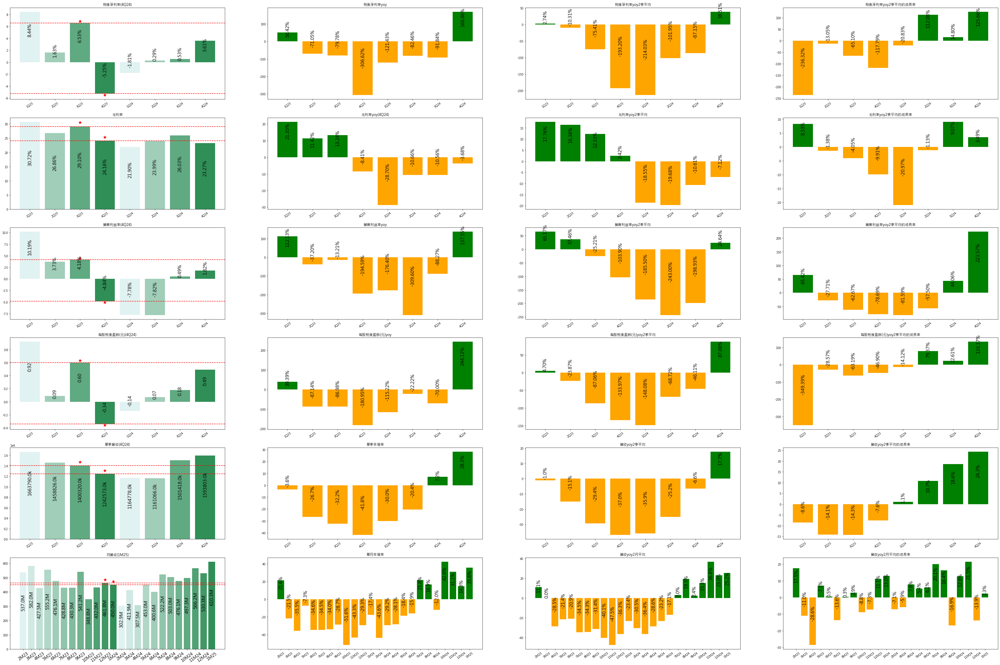

8096基本面分析
營收分數: 3
8096的分數(2024Q4 | 2025M1): 14/15


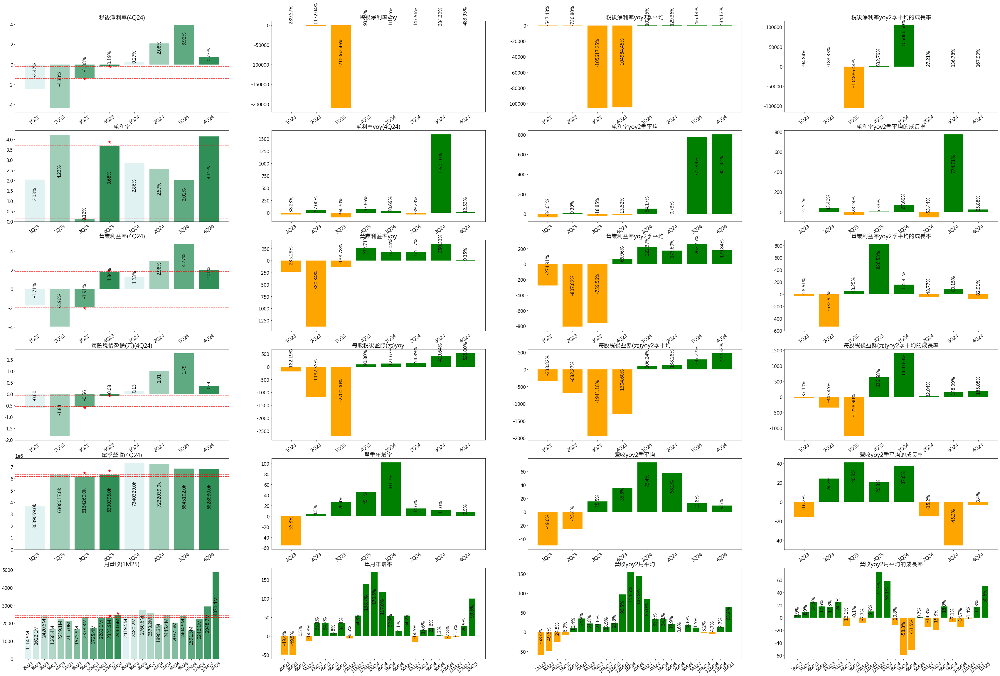

6877基本面分析
營收分數: 2
6877的分數(2024Q4 | 2025M1): 6/15


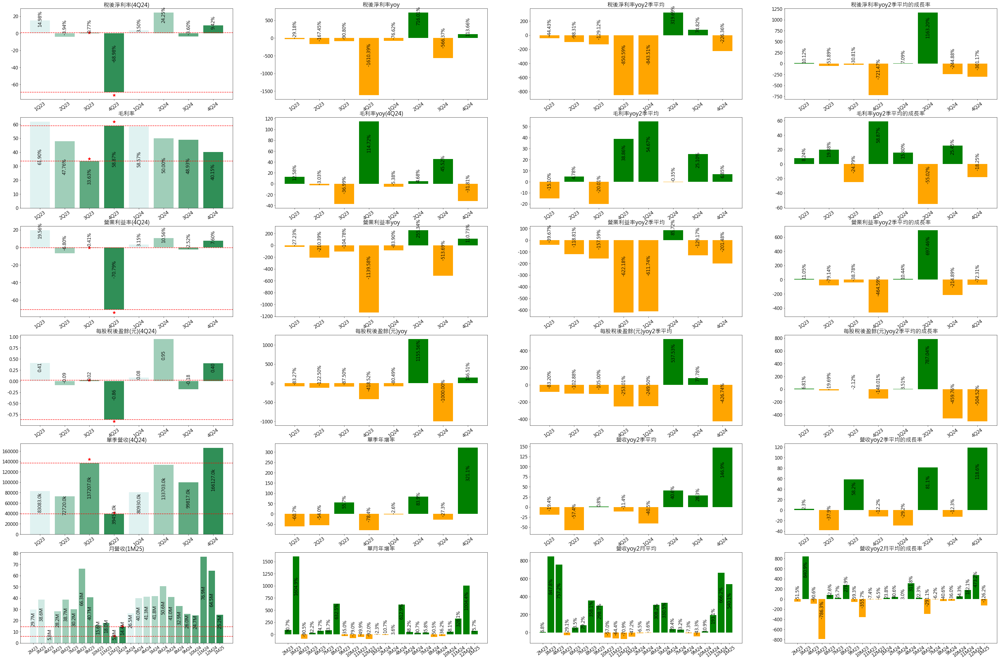

6781基本面分析
營收分數: 1
6781的分數(2024Q3 | 2025M1): 15/15


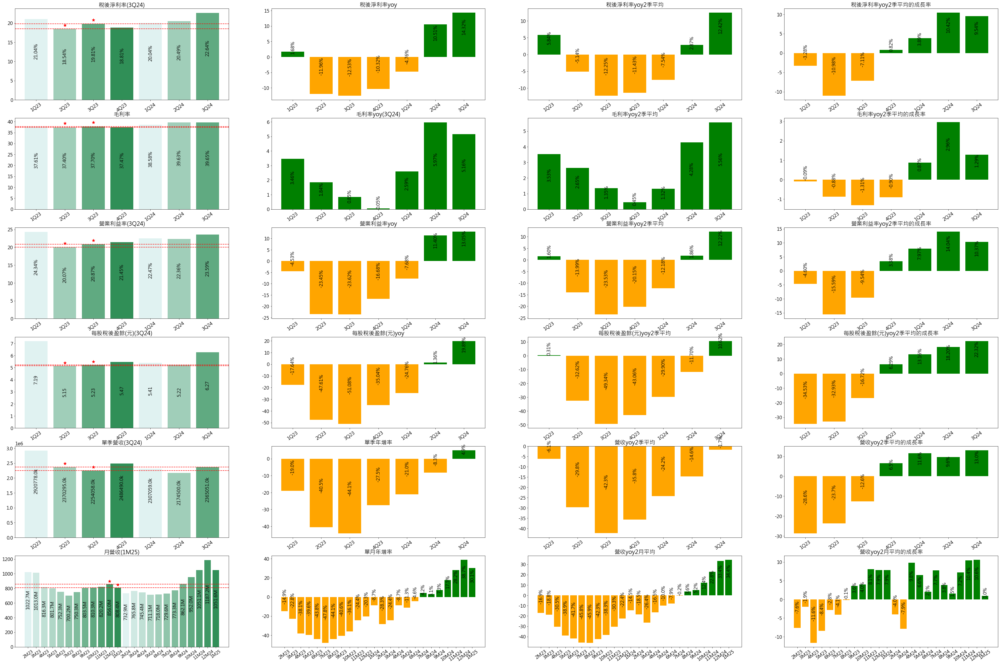

6667基本面分析
營收分數: 2
6667的分數(2024Q4 | 2025M1): 7/15


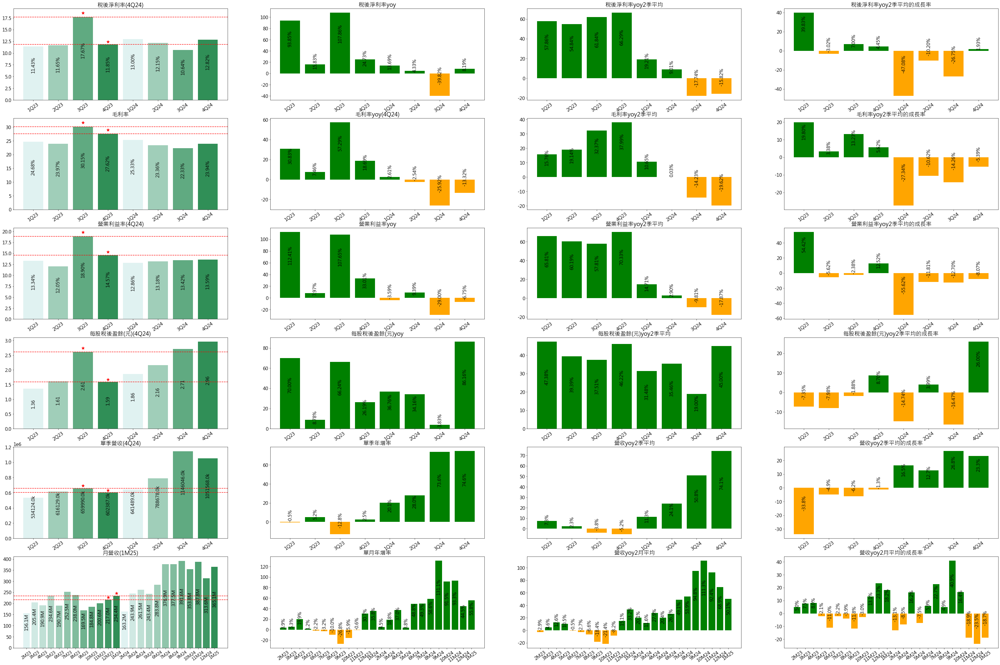

5439基本面分析
營收分數: 2
5439的分數(2024Q3 | 2025M1): 3/15


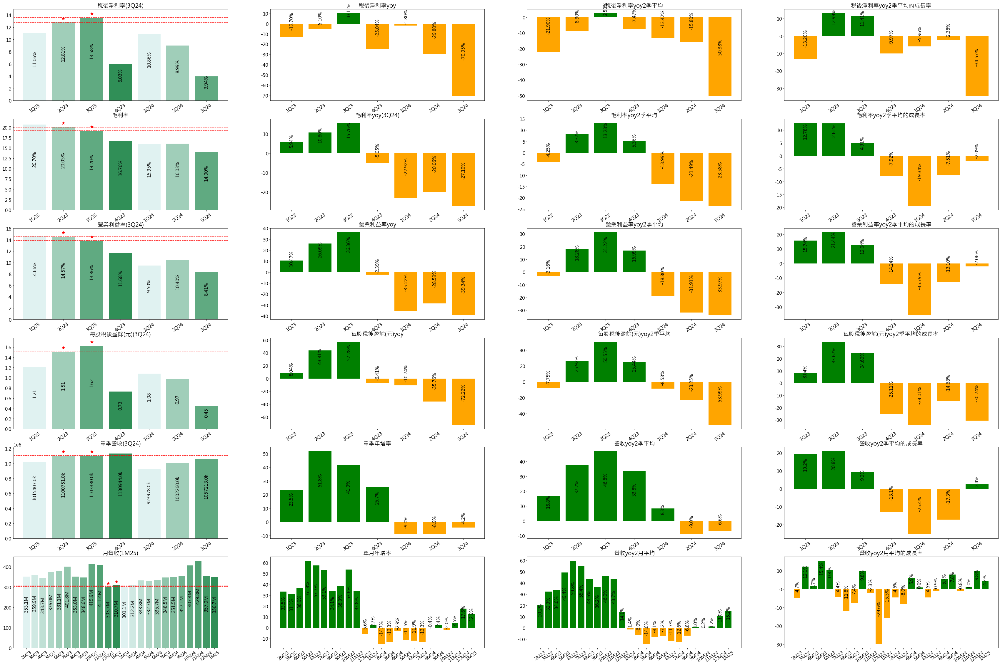

4303基本面分析
營收分數: 3
4303的分數(2024Q4 | 2025M1): 10/15


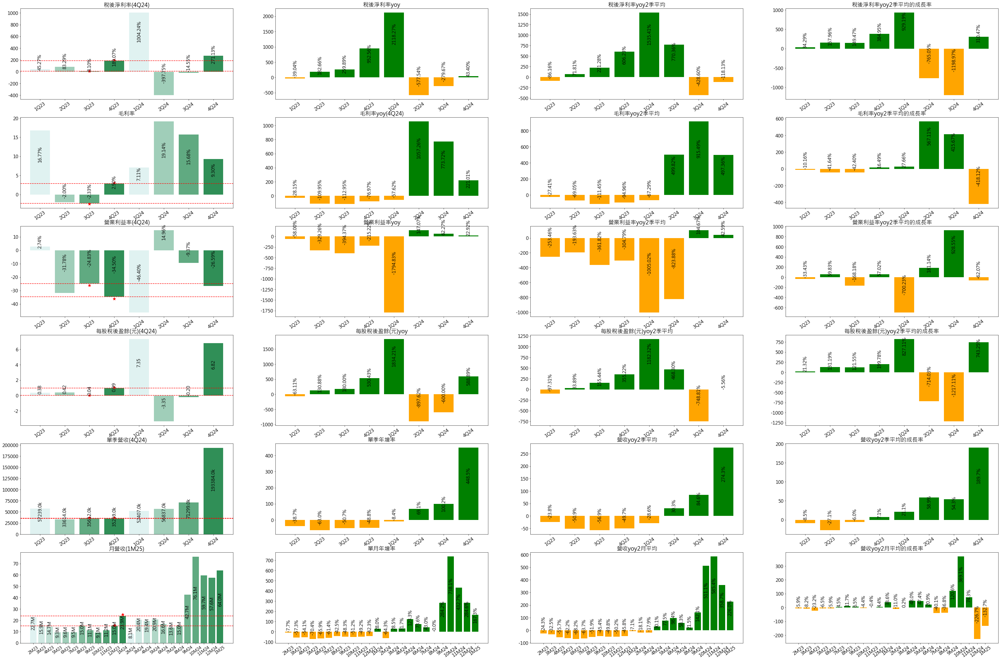

3563基本面分析
營收分數: 3
3563的分數(2024Q4 | 2025M1): 14/15


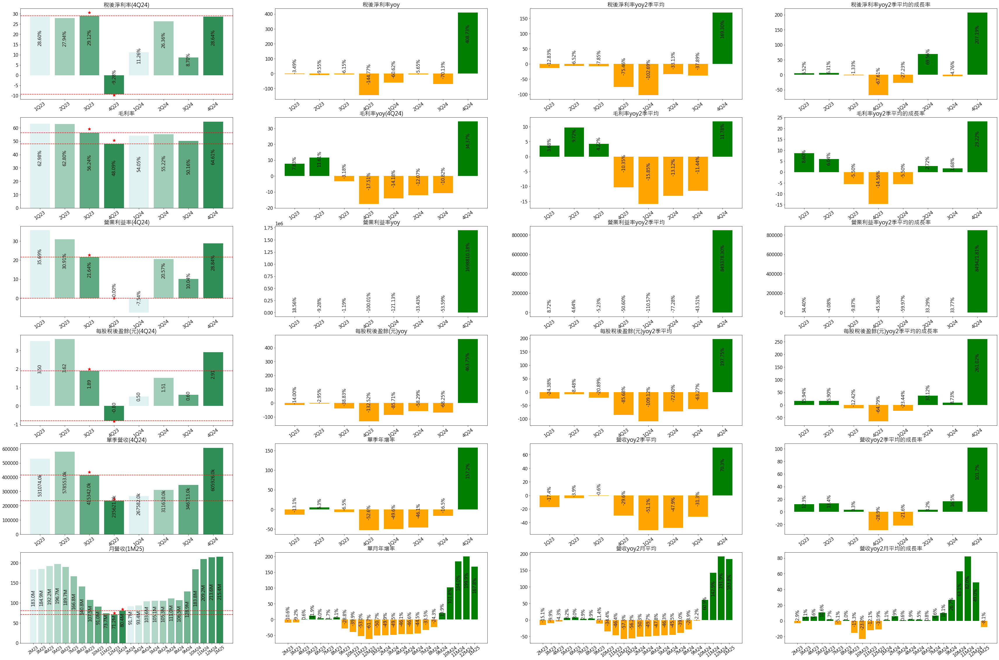

3491基本面分析
營收分數: 2
3491的分數(2024Q3 | 2025M1): 14/15


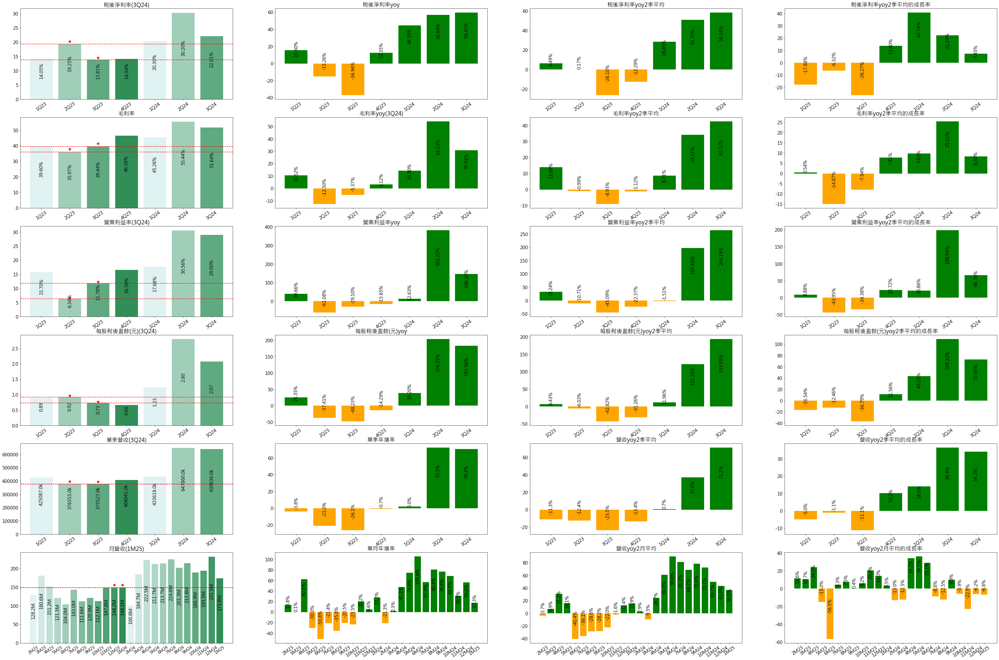

3379基本面分析
營收分數: 3
3379的分數(2024Q4 | 2025M1): 6/15


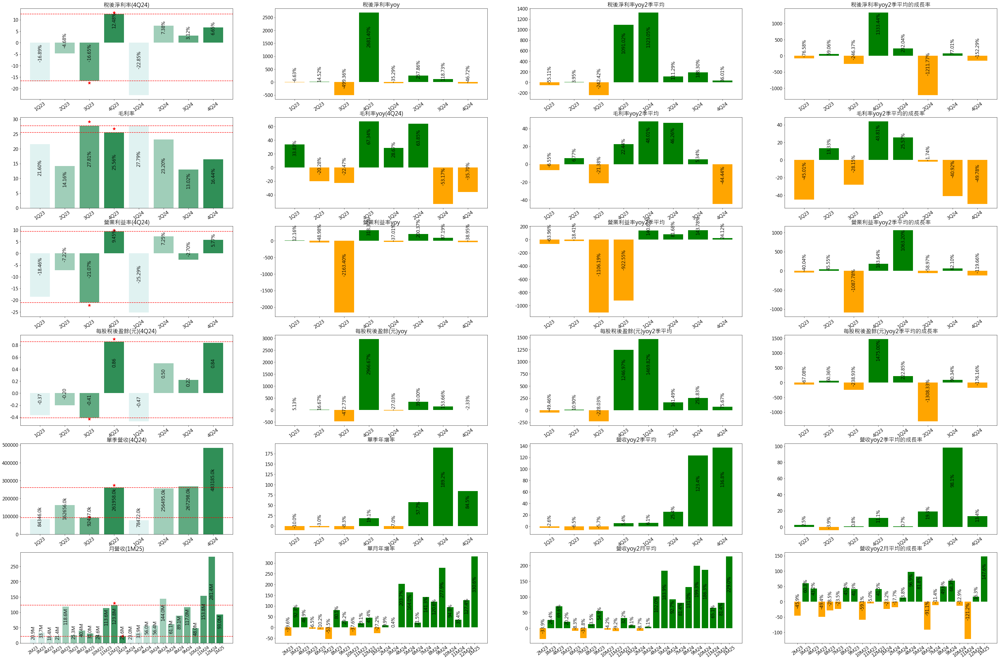

3363基本面分析
營收分數: 1
3363的分數(2024Q4 | 2025M1): 3/15


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


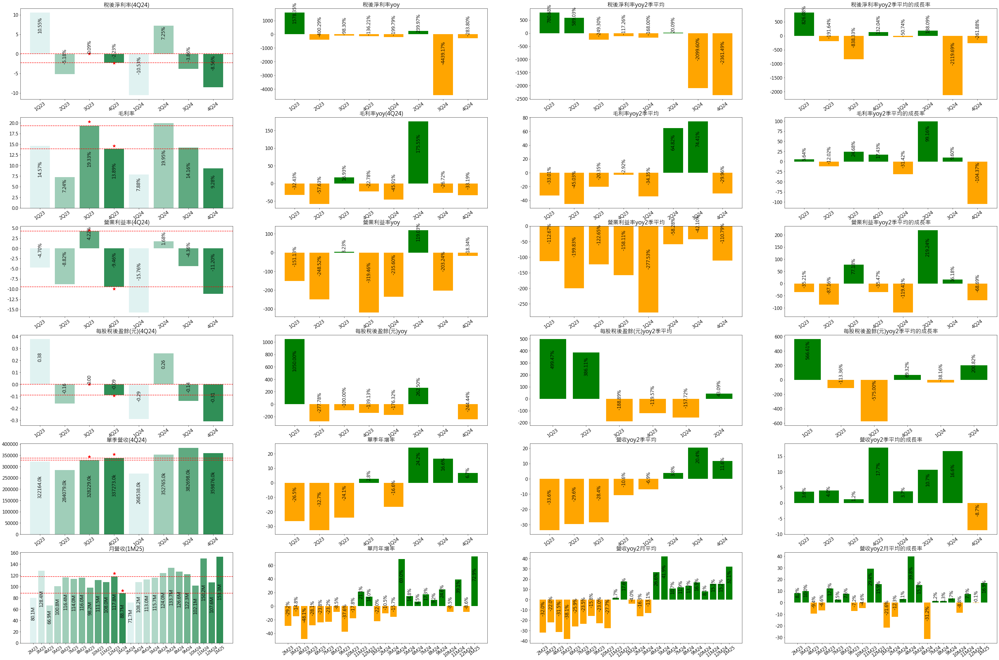

3029基本面分析
營收分數: 3
3029的分數(2024Q4 | 2025M1): 8/15


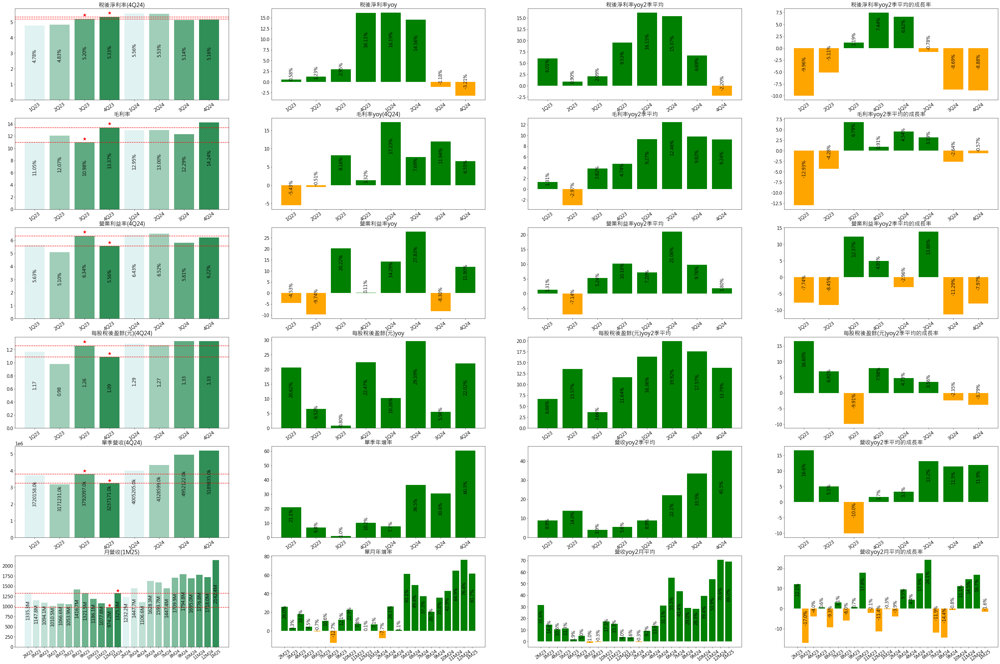

2468基本面分析
營收分數: 2
2468的分數(2024Q4 | 2025M1): 10/15


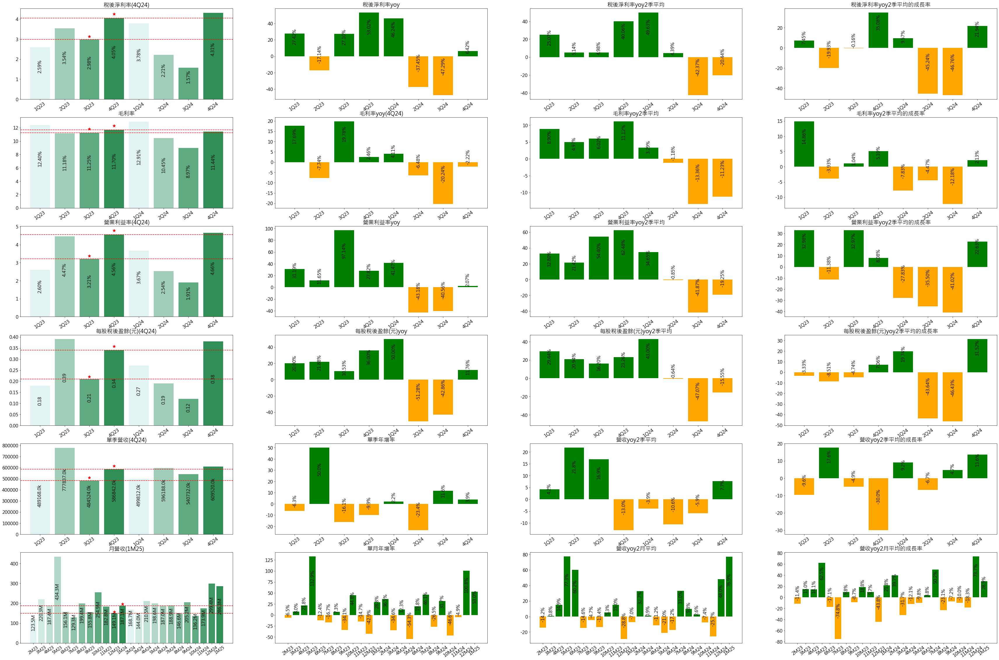

2429基本面分析
營收分數: 3
2429的分數(2024Q3 | 2025M1): 4/15


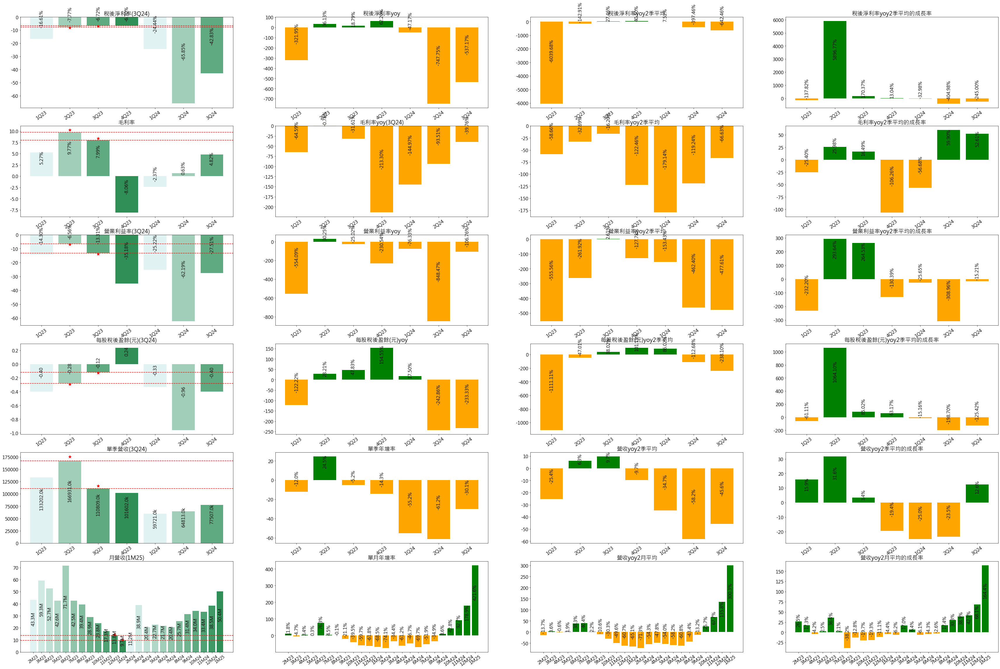

2328基本面分析
營收分數: 1
2328的分數(2024Q3 | 2025M1): 11/15


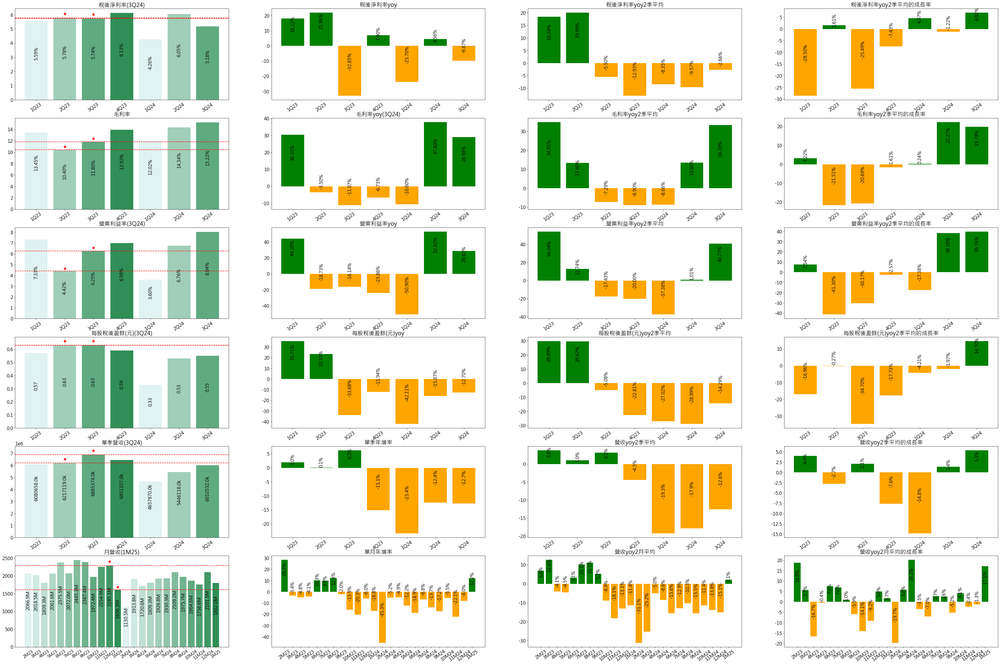

1736基本面分析
營收分數: 2
1736的分數(2024Q4 | 2025M1): 13/15


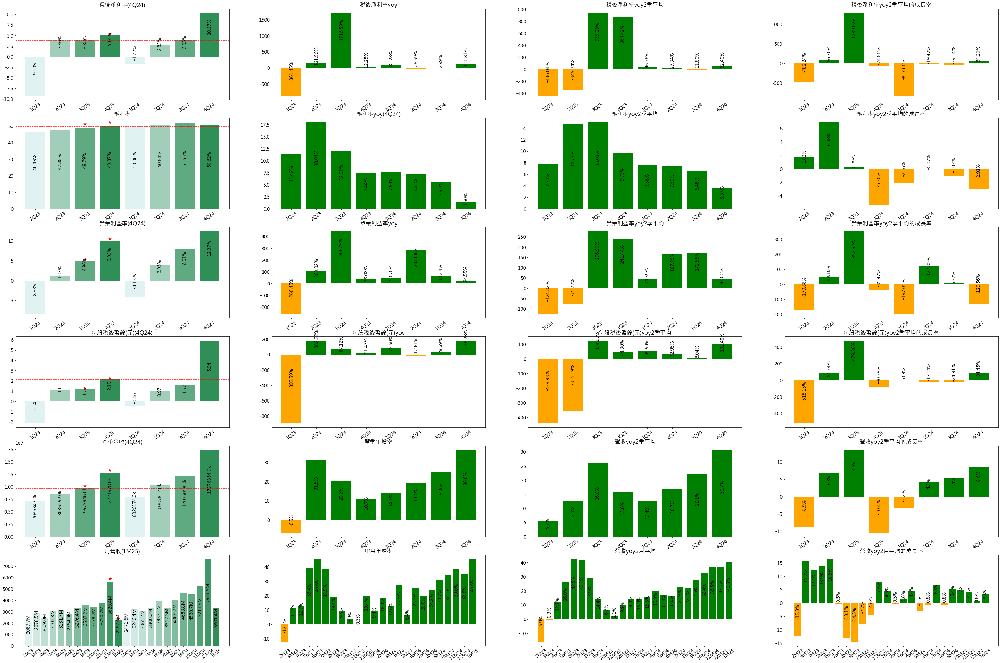

8234的分數(2024Q4 | 2025M1): 13/15 | 2
8096的分數(2024Q4 | 2025M1): 14/15 | 3
6877的分數(2024Q4 | 2025M1): 6/15 | 2
6781的分數(2024Q3 | 2025M1): 15/15 | 1
6667的分數(2024Q4 | 2025M1): 7/15 | 2
5439的分數(2024Q3 | 2025M1): 3/15 | 2
4303的分數(2024Q4 | 2025M1): 10/15 | 3
3563的分數(2024Q4 | 2025M1): 14/15 | 3
3491的分數(2024Q3 | 2025M1): 14/15 | 2
3379的分數(2024Q4 | 2025M1): 6/15 | 3
3363的分數(2024Q4 | 2025M1): 3/15 | 1
3029的分數(2024Q4 | 2025M1): 8/15 | 3
2468的分數(2024Q4 | 2025M1): 10/15 | 2
2429的分數(2024Q3 | 2025M1): 4/15 | 3
2328的分數(2024Q3 | 2025M1): 11/15 | 1
1736的分數(2024Q4 | 2025M1): 13/15 | 2


In [7]:
# choosen = '3605 6863 5536 2357 3294'.split(' ')
## 2 3 3 1 0
choosen = qualify_stock_list
score_list = []
Rev_score_list = []

print(initial_time, end_time)
for ID in choosen:
# for ID in ['8028']:
    figure_num = 6
    try:
        SF = StockFundamental(stockID=ID, financial_statement_df=financial_statement_df, monthly_revenue_df=monthly_revenue_df, initial_time = initial_time, end_time = end_time)
        plt.figure(figsize=(60, 40))
        print(f'{SF.stockID}基本面分析')
        Rev_score = SF.get_revenue_score()
        print(f'營收分數: {Rev_score}')
        SF.plot_quarterly_Post_TaxPR()
        SF.plot_quarterly_GPR()
        SF.plot_quarterly_OPR()
        SF.plot_quarterly_EPS()
        SF.plot_quarterly_revenue()
        SF.month_revenue()
        score_list.append(SF.get_score())
        Rev_score_list.append(Rev_score)
        plt.show()
    except Exception as e:
        print(f'{bcolors.FAIL}Failed to get the data of {ID}{bcolors.RESET}')
        print(e)
        continue
for score, R_score in zip(score_list, Rev_score_list):
    print(score, end=' | ')
    print(R_score)

In [9]:
def export_tradingview_list(D, name, qualify_stock_list, allstock_info, OTC):
    text = ''
    if OTC == 1:
        text += f'###11(a)\n'
        text += f'###12(b1)\n'
        text += f'###13(b2)\n'
        text += f'###14(b3)\n'
        text += f'###15(c)\n'
        text += f'###16(d)\n'
        text += f'###17(e)\n'
        text += f'###18(f)\n'
    elif OTC == 2:
        text += f'###21(a1)\n'
        text += f'###22(a2)\n'
        text += f'###23(b1)\n'
        text += f'###24(b2)\n'
        text += f'###25(c)\n'
        text += f'###26(d)\n'
        text += f'###27(e)\n'
        text += f'###28(f)\n'
        text += f'###29(g)\n'
    elif OTC == 3:
        text += f'###B3(a)\n'
        text += f'###B6(b)\n'
        text += f'###17(c)\n'
        text += f'###29(d)\n'
    text += f'###觀察\n'
    text += f'###新增\n'
    for id in qualify_stock_list:
        try:
            # print(id)
            id = str(id)
            if allstock_info.loc[id, '市場別'] == '上櫃':
                text += f'TPEX:{id}\n'
            elif allstock_info.loc[id, '市場別'] == '上市':
                text += f'TWSE:{id}\n'
            # create and save to txt
        except:
            pass
    print(len(qualify_stock_list))
    with open(f'C:/Users/User/Desktop/StockInfoHub/Stock_Data_Collector/tradingview觀察清單/{D}_{name}.txt', 'w', encoding='utf-8') as f:
        f.write(text)
    print(f'{D}_{name}.txt saved')

export_tradingview_list(D, 'RE', qualify_stock_list, allstock_info, 3)

16
2025-03-14_RE.txt saved


In [9]:
#看個股產業
import pandas as pd
import requests
import IPython.display as ipd
d = '2025-03-04'
industry_df = pd.read_excel(r'C:\Users\User\Desktop\stock\others\產業別.xlsx').astype(int).astype(str)
group_df = pd.read_excel(r'C:\Users\User\Desktop\stock\others\族群_複製.xlsx').astype(int).astype(str)
concept_df = pd.read_excel(r'C:\Users\User\Desktop\stock\others\概念股_複製.xlsx').astype(int).astype(str)
rschoose_df = pd.read_excel(fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{d}_with_template.xlsx')

alist = []
industry_category_df = []
show = True
CF_df = rschoose_df.sort_values(by='business volume(億)', ascending=False)
CF_df['ID'] = CF_df['ID'].apply(lambda x: str(x).split('.')[0])
CF_df = CF_df.reset_index(drop=True)
CF_df['CF'] = [round(100-(i/14), 1) for i in CF_df.index.values]
to_watch = sort_ID #sort_ID, watch_IDs
# to_watch = '6763'.split(' ')

for id in qualify_stock_list:
    stock_ind = []
    stock_ind.append(CF_df.loc[CF_df['ID'].astype(str) == id, 'ERS_rate_250'].values[0])
    stock_ind.append(CF_df.loc[CF_df['ID'].astype(str) == id, 'CF'].values[0])
    for col in industry_df.columns.values:
        if id in industry_df[col].values:
            stock_ind.append(col)
    for col in group_df.columns.values:
        if id in group_df[col].values:
            stock_ind.append(col)
    for col in concept_df.columns.values:
        if id in concept_df[col].values:
            stock_ind.append(col)
    alist.append((id,stock_ind))

for ind in alist:
    if show:
        print(ind[0], f'| RS({ind[1][0]}) | CF({ind[1][1]})', '-->', end=' ')
    for i in set(ind[1][2:]):
        if show:
            print(i, end=' ')
        industry_category_df.append([ind[0], i])
    print('')
industry_category_df = pd.DataFrame(industry_category_df,columns=['ID', 'category'])
industry_category_df['count'] = 1
industry_category_df = industry_category_df.groupby('category').sum()
count_df = industry_category_df.sort_values(by='count', ascending=False)
ipd.display(count_df.iloc[:30])

8234 | RS(99.06025428413488) | CF(79.6) --> 電腦系統業 電動車 智慧城市 電子下游_工業電腦 
8096 | RS(99.50248756218906) | CF(98.7) --> 電子上游_IC_設計 電子通路 
6877 | RS(94.96959646213378) | CF(72.4) --> 傳產_生技 
6781 | RS(94.19568822553897) | CF(97.5) --> 電子中游_電源供應器 汽機車零組件 鴻海MIH電動車品牌 電力設備 
6667 | RS(91.10005527915976) | CF(84.6) --> 電子中游_儀器設備工程 設備儀器廠商 
5439 | RS(95.02487562189054) | CF(91.1) --> 電子上游_PCB_製造 PCB 電動車 印刷電路板相關 
4303 | RS(97.01492537313433) | CF(87.3) --> 石化業 傳產_塑膠 
3563 | RS(95.9093421779989) | CF(94.2) --> 電子中游_儀器設備工程 設備儀器廠商 
3491 | RS(97.95467108899945) | CF(94.1) --> CES 通訊設備 濾波器 軌道衛星 5G 電子中游_通訊設備 
3379 | RS(99.6130458817026) | CF(96.1) --> 傳產_電機 機械 
3363 | RS(99.17081260364843) | CF(81.9) --> 5G 電子上游_被動元件 光通訊 
3029 | RS(97.23604201216142) | CF(92.5) --> Internet技術與基礎設施 Chatgpt 軟體_系統整合 軟體業 人工智慧 
2468 | RS(97.51243781094527) | CF(88.8) --> 軟體業 資安 軟體_系統整合 
2429 | RS(97.62299613045882) | CF(69.5) --> 電子中游_其他 面板零組件 PCB 
2328 | RS(88.8888888888889) | CF(98.6) --> 連接器 switch 印刷電路板相關 電腦系統業 A股入摩 車用電子 電子零件元件

,count
category,
5G,2
傳產_生技,2
電腦系統業,2
電子中游_儀器設備工程,2
電動車,2
軟體_系統整合,2
設備儀器廠商,2
印刷電路板相關,2
軟體業,2


In [8]:
def calculate_K_strength(K_data, id):
    o, h, l, c = K_data
    K_strength = 100*((c-l)/(h-l))
    K_body_strength = 100*((c-o)/(h-l))
    K_upper_shadow_strength = 100*((h-max(o, c))/(h-l))
    K_lower_shadow_strength = 100*((min(o, c)-l)/(h-l))
    return [i, K_strength, K_body_strength, K_upper_shadow_strength, K_lower_shadow_strength]

buy_list = '4129'.split(' ')
buy_D = '2023-11-20'
buy_path = fr'C:\Users\User\Desktop\stock\data_test'
K_strength_list = []
for i in buy_list:
    try:
        df = pd.read_csv(f'{buy_path}/{i}.TW.csv')
    except:
        df = pd.read_csv(f'{buy_path}/{i}.TWO.csv')
    K_data = df.loc[df['Date'] == buy_D, ['Open', 'High', 'Low', 'Close']].values[0]
    K_strength = calculate_K_strength(K_data, i)
    K_strength_list.append(K_strength)
K_strength_df = pd.DataFrame(K_strength_list, columns=['ID', 'K_strength', 'K_body_strength', 'K_upper_shadow_strength', 'K_lower_shadow_strength'])
K_strength_df.set_index('ID', inplace=True)
K_strength_df.round(1).to_excel(fr'C:\Users\User\Desktop\投資檢討\回測\CMR策略\觀察清單\{buy_D}_觀察清單.xlsx')

print(K_strength_df.round(1))    
    

      K_strength  K_body_strength  K_upper_shadow_strength  \
ID                                                           
4129        89.4             66.7                     10.6   

      K_lower_shadow_strength  
ID                             
4129                     22.7  


In [7]:
# D = '2025-03-03'
buy_D = '2022-08-31'
buy_list = '5425 8996'.split(' ')
path = fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{buy_D}_with_template.xlsx'
df_watch = pd.read_excel(path)
df_watch['ID_split'] = df_watch['ID'].apply(lambda x:x.split('.')[0])
df_watch['KS'] = 0
df_watch['KBS'] = 0
df_watch['USS'] = 0
df_watch['LSS'] = 0
df_watch['RRSI'] = 0
df_watch['KS'] = list(map(lambda h,l,c,o: 100*((c-l)/(h-l)) if (h-l) != 0 else 0, df_watch['High'], df_watch['Low'], df_watch['Close'], df_watch['Open']))
df_watch['KBS'] = list(map(lambda h,l,c,o: 100*((c-o)/(h-l)) if (h-l) != 0 else 0, df_watch['High'], df_watch['Low'], df_watch['Close'], df_watch['Open']))
df_watch['USS'] = list(map(lambda h,l,c,o: 100*((h-max(o, c))/(h-l)) if (h-l) != 0 else 0, df_watch['High'], df_watch['Low'], df_watch['Close'], df_watch['Open']))
df_watch['LSS'] = list(map(lambda h,l,c,o: 100*((min(o, c)-l)/(h-l)) if (h-l) != 0 else 0, df_watch['High'], df_watch['Low'], df_watch['Close'], df_watch['Open']))
df_watch['RRSI'] = df_watch['RSI'].apply(lambda x: x-df_watch.loc[df_watch['ID'] == '0050.TW', 'RSI'].values[0])
df_watch.set_index('ID_split', inplace=True)
df_watch = df_watch.loc[buy_list]

print(df_watch[['KS', 'KBS', 'USS', 'LSS', 'RRSI', 'ERS_rate_20', 'ERS_rate_50', 'ERS_rate_250']].round(1))
df_watch[['KS', 'KBS', 'USS', 'LSS', 'RRSI', 'ERS_rate_20', 'ERS_rate_50', 'ERS_rate_250']].round(1).to_excel(fr'C:\Users\User\Desktop\投資檢討\回測\CMR策略\觀察清單\{buy_D}_觀察清單.xlsx')

             KS   KBS  USS   LSS  RRSI  ERS_rate_20  ERS_rate_50  ERS_rate_250
ID_split                                                                      
5425      100.0  94.6  0.0   5.4  19.3         94.4         93.4          92.4
8996      100.0  66.7  0.0  33.3  33.5         99.6         99.5          98.9


#### 個個策略匯出

In [324]:
high_performance_id = '1513'.split(' ')
df_origin.loc[df_origin['ID_split'].isin(high_performance_id), ['ID_split', 'K線強度', 'K線實體強度', '上影線強度', '下影線強度', 'RRSI', 'ERS_rate_20', 'ERS_rate_50', 'ERS_rate_250']]

,ID_split,K線強度,K線實體強度,上影線強度,下影線強度,RRSI,ERS_rate_20,ERS_rate_50,ERS_rate_250
1696,1513,91.428593,85.714286,8.571407,5.714308,22.811315,94.349315,95.719178,93.835616


In [ ]:
ST1 = df_origin.loc[df_origin['ID_split'].isin(high_performance_id), ['ID_split', 'K線強度', 'K線實體強度', '上影線強度', '下影線強度', 'RRSI', 'ERS_rate_20', 'ERS_rate_50', 'ERS_rate_250']]
ST17

,ID_split,K線強度,K線實體強度,上影線強度,下影線強度,RRSI,ERS_rate_20,ERS_rate_50,ERS_rate_250
1237,2881,91.666431,58.332962,8.333569,33.333468,24.001275,95.690157,93.185789,83.527357
1660,1477,57.142635,7.142524,42.857365,50.000111,10.259834,92.894584,87.944089,81.315483


In [325]:
ST17 = ST17.append(df_origin.loc[df_origin['ID_split'].isin(high_performance_id), ['ID_split', 'K線強度', 'K線實體強度', '上影線強度', '下影線強度', 'RRSI', 'ERS_rate_20', 'ERS_rate_50', 'ERS_rate_250']])
ST17

,ID_split,K線強度,K線實體強度,上影線強度,下影線強度,RRSI,ERS_rate_20,ERS_rate_50,ERS_rate_250
1237,2881,91.666431,58.332962,8.333569,33.333468,24.001275,95.690157,93.185789,83.527357
1660,1477,57.142635,7.142524,42.857365,50.000111,10.259834,92.894584,87.944089,81.315483
660,5289,79.999869,13.333348,20.000131,66.666521,28.576850,95.809080,93.833624,81.908086
1476,2303,24.137945,-62.068907,13.793149,24.137945,13.457805,94.062864,87.667248,87.318208
645,5347,95.238095,85.714286,4.761905,9.523810,10.565736,97.673066,98.023256,92.441860
1587,1727,100.000000,74.999970,0.000000,25.000030,19.226604,99.825480,99.709302,98.488372
1753,1229,82.353012,52.941265,17.646988,29.411747,23.587762,95.811518,92.441860,80.174419
7,9945,51.612898,-12.903183,35.483919,51.612898,29.199812,96.974985,97.906977,96.279070
462,6213,69.565217,60.869565,30.434783,8.695652,29.756224,98.487493,97.558140,84.941860
997,3529,95.833333,83.333333,4.166667,12.500000,32.127661,98.778360,99.244186,99.186047


In [326]:
ST17.to_excel('C:/Users/User/Desktop/S17_stock_summary.xlsx', index=False)

#### 倉位

In [ ]:
import numpy as np
def get_position(position): 
    close = input("close price : ")
    close = float(close)
    shares = position / close
    print(f'close : {close}')
    print(f'shares/0.05 position : {shares*0.05}')
    for i in np.arange(0.05, 1, 0.05):
        print(round(i, 2), round(shares*i))
position = 165000
get_position(position)

In [ ]:
scan_stock = '8261'
try:
    stock_df = pd.read_csv(fr'C:\Users\User\Desktop\stock\data_test\{scan_stock}.TW.csv', parse_dates=['Date'], header=0)
except:
    stock_df = pd.read_csv(fr'C:\Users\User\Desktop\stock\data_test\{scan_stock}.TWO.csv', parse_dates=['Date'], header=0)
stock_df = stock_df.set_index('Date')
scan_start_time = '2020-01-01'
scan_end_time = '2020-11-12'
stock_df['RS_rate_10'] = stock_df['RS value'].rolling(window=10).mean()
stock_df = stock_df.loc[scan_start_time:scan_end_time]




In [ ]:
import numpy as np
def get_position(position): 
    close = input("close price : ")
    close = float(close)
    shares = position / close
    print(f'close : {close}')
    print(f'shares/0.05 position : {shares*0.05}')
    for i in np.arange(0.05, 1, 0.05):
        print(round(i, 2), round(shares*i))
position = 660000
get_position(position)

In [ ]:
# choosen = '3605 6863 5536 2357 3294'.split(' ')
## 2 3 3 1 0
choosen = '8086 6669 6558 6510 6451 6278 6269 4958 4943 3673 3653 3374'.split(' ')
score_list = []
Rev_score_list = []
end_time = D
start_fc = lambda x: f'{int(x.split("-")[0])-2}-{int(x.split("-")[1])}-{int(x.split("-")[2])}'
end_fc = lambda x: f'{int(x.split("-")[0])}-{int(x.split("-")[1])}-{int(x.split("-")[2])}'
end_time = end_fc(D)
initial_time = start_fc(D)
print(initial_time, end_time, len(choosen))
## 合格股票
qualify_stock_list = []
for ID in choosen:
    figure_num = 6
    try:
        SF = StockFundamental(stockID=ID, financial_statement_df=financial_statement_df, monthly_revenue_df=monthly_revenue_df, initial_time = initial_time, end_time = end_time)
        print(f'{SF.stockID}基本面分析')
        Rev_score = SF.get_revenue_score()
        print(f'營收分數: {Rev_score}')
        Rev_score_list.append((SF.stockID, Rev_score))
        if Rev_score > 0:
            qualify_stock_list.append(ID)
    except:
        print(f'{bcolors.FAIL}Failed to get the data of {ID}{bcolors.RESET}')
        continue
# for R_score in Rev_score_list:
    # print(R_score)



#### 基本面分數

In [ ]:
for score, R_score in zip(score_list, Rev_score_list):
    print(score, end=' | ')
    print(R_score)

In [ ]:
choosen = '8234 6763 6446 6290 6139 3558 3264 3162 3019 2395 2049 1815'.split(' ')
## 2 3 3 1 0
# choosen = sort_ID
score_list = []
Rev_score_list = []
initial_time = '2023-03-31'
end_time = '2024-12-28'
initial_time = pd.to_datetime(initial_time)
end_time = pd.to_datetime(end_time)
for ID in choosen:
    figure_num = 6
    try:
        SF = StockFundamental(stockID=ID, financial_statement_df=financial_statement_df, monthly_revenue_df=monthly_revenue_df, initial_time = initial_time, end_time = end_time)
        plt.figure(figsize=(60, 40))
        print(f'{SF.stockID}基本面分析')
        Rev_score = SF.get_revenue_score()
        print(f'營收分數: {Rev_score}')
        SF.plot_quarterly_Post_TaxPR()
        SF.plot_quarterly_GPR()
        SF.plot_quarterly_OPR()
        SF.plot_quarterly_EPS()
        SF.plot_quarterly_revenue()
        SF.month_revenue()
        score_list.append(SF.get_score())
        Rev_score_list.append(Rev_score)
        plt.show()
    except Exception as e:
        print(f'{bcolors.FAIL}Failed to get the data of {ID}{bcolors.RESET}')
        print(e)
        continue
for score, R_score in zip(score_list, Rev_score_list):
    print(score, end=' | ')
    print(R_score)

In [ ]:
import numpy as np
position = 660000
close = input("close price : ")
close = float(close)
shares = position / close
print(f'close : {close}')
print(f'shares/0.05 position : {shares*0.05}')
for i in np.arange(0.05, 1, 0.05):
    print(round(i, 2), round(shares*i))

### 回測excel補資料

In [ ]:
df = pd.read_excel(r'C:\Users\User\Desktop\投資檢討\回測\CMR策略\交易(用RE選股).XLSX', header=0)
df.drop(df.loc[df['倉位'].isna()].index, inplace=True, axis=0)
df['K線強度'] = 0
df['K線實體強度'] = 0
df['上影線強度'] = 0
df['下影線強度'] = 0
df['RRSI'] = 0
df.head()
write_df = df.copy()

In [ ]:
for day, stock_id in zip(df['進場日期1'], df['股票名稱']):
    try:
        print(str(day), stock_id)
        stock_id = str(stock_id)
        template_df = pd.read_excel(fr'C:\Users\User\Desktop\stock\全個股條件篩選\daily_stock_summary_{str(day).split(" ")[0]}_with_template.xlsx', header=0)
        template_df['ID'] = template_df['ID'].apply(lambda x: x.split('.')[0])
        template_df['RRSI'] = template_df['RSI'].apply(lambda x: x-template_df.loc[template_df['ID'] == '0050', 'RSI'].values[0])

        stock_H = template_df.loc[template_df['ID'] == stock_id, 'High'].values[0]
        stock_L = template_df.loc[template_df['ID'] == stock_id, 'Low'].values[0]
        stock_C = template_df.loc[template_df['ID'] == stock_id, 'Close'].values[0]
        stock_O = template_df.loc[template_df['ID'] == stock_id, 'Open'].values[0]

        write_df['進場日期1'] = write_df['進場日期1'].apply(lambda x: str(x).split(" ")[0])
        day = str(day).split(" ")[0]
        stock_id = int(stock_id)
        # print(write_df.loc[write_df['進場日期1'] == day].loc[write_df['股票名稱'] == stock_id])

        # print(template_df.loc[template_df['ID'] == str(stock_id), 'RRSI'].values[0])
        write_df.loc[list(map(lambda x, y: all([x == day, y == int(stock_id)]), write_df['進場日期1'].values, write_df['股票名稱'].values)), 'RRSI'] = round(template_df.loc[template_df['ID'] == str(stock_id), 'RRSI'].values[0], 1)
        write_df.loc[list(map(lambda x, y: all([x == day, y == int(stock_id)]), write_df['進場日期1'].values, write_df['股票名稱'].values)), 'K線強度'] = round(100*(stock_C - stock_L) / (stock_H - stock_L), 1)
        write_df.loc[list(map(lambda x, y: all([x == day, y == int(stock_id)]), write_df['進場日期1'].values, write_df['股票名稱'].values)), 'K線實體強度'] = round(100*(stock_C - stock_O) / (stock_H - stock_L), 1)
        write_df.loc[list(map(lambda x, y: all([x == day, y == int(stock_id)]), write_df['進場日期1'].values, write_df['股票名稱'].values)), '上影線強度'] = round(100*(stock_H - max(stock_C, stock_O)) / (stock_H - stock_L), 1)
        write_df.loc[list(map(lambda x, y: all([x == day, y == int(stock_id)]), write_df['進場日期1'].values, write_df['股票名稱'].values)), '下影線強度'] = round(100*(min(stock_C, stock_O) - stock_L) / (stock_H - stock_L), 1)
    except:
        print(f'Failed to get the data of {stock_id}')
        continue
print(write_df.head())

In [ ]:
write_df.to_excel(r'C:\Users\User\Desktop\投資檢討\回測\CMR策略\交易(用RE選股)_with_template.xlsx', index=False)

### 回測交易結果分析

In [66]:
import pandas as pd
import numpy as np

# df = pd.read_excel(r'C:\Users\User\Desktop\投資檢討\回測\CMR策略\交易(用RE選股).XLSX', header=0)
df = pd.read_excel(r'C:\Users\User\Desktop\投資檢討\回測\CMR策略\交易(用RE選股只用13.16.17.23.28.29策略).XLSX', header=0)

df.drop(df.loc[df['倉位'].isna()].index, inplace=True, axis=0)
df.drop(df.loc[df['K線強度'] == 0].index, inplace=True, axis=0)
df['下影線強度'] = df['下影線強度'].apply(lambda x: x//10)
df['上影線強度'] = df['上影線強度'].apply(lambda x: x//10)
df['K線強度'] = df['K線強度'].apply(lambda x: x//10)
df['K線實體強度'] = df['K線實體強度'].apply(lambda x: x//10)
df['RRSI'] = df['RRSI'].apply(lambda x: x//10)
df['大策略'] = df['策略']
due_date = '2021/2/1 ~ 2023/11/13'
df.head()

,股票名稱,櫃買,策略,起漲K,營收,財報,K線強度,K線實體強度,上影線強度,下影線強度,...,持有時間,倉位大小,投資成本,損益,停損%,盈虧比,買價,股數/0.05倉,檢討數字,大策略
2,4576,1.0,13,2.0,2.0,15.0,4.0,4.0,5.0,0.0,...,1,0.4,66000.0,-604.0,3.0,-0.305051,NaN,NaN,NaN,13
3,6237,1.0,16,3.0,3.0,11.0,6.0,4.0,3.0,1.0,...,1,0.6,99000.0,6874.0,3.0,2.314478,NaN,NaN,NaN,16
4,6283,1.0,16,3.0,3.0,5.0,9.0,7.0,0.0,1.0,...,1,0.5,82500.0,10303.0,3.0,4.162828,NaN,NaN,NaN,16
5,4939,1.0,16,1.0,3.0,12.0,6.0,5.0,3.0,1.0,...,1,0.4,66000.0,242.0,3.0,0.122222,NaN,NaN,NaN,16
7,1802,1.0,16,3.0,1.0,15.0,9.0,7.0,0.0,1.0,...,5,0.6,99000.0,13489.0,3.0,4.541751,NaN,NaN,NaN,16


In [67]:
# df['大策略'] = df['大策略'].apply(lambda x: 12 if x == 13 else x)
# df['大策略'] = df['大策略'].apply(lambda x: 12 if x == 14 else x)
# df['大策略'] = df['大策略'].apply(lambda x: 22 if x == 21 else x)
# df['大策略'] = df['大策略'].apply(lambda x: 24 if x == 23 else x)

df['大策略'] = df['大策略'].apply(lambda x: 'B3' if x == 13 else x)
df['大策略'] = df['大策略'].apply(lambda x: 'B3' if x == 23 else x)
df['大策略'] = df['大策略'].apply(lambda x: 29 if x == 29 else x)
df['大策略'] = df['大策略'].apply(lambda x: 17 if x == 17 else x)
df['大策略'] = df['大策略'].apply(lambda x: 'B6' if x == 16 else x)
df['大策略'] = df['大策略'].apply(lambda x: 'B6' if x == 28 else x)



In [63]:
df = df.loc[df['策略'].isin([13, 16, 17, 23, 28, 29])]

In [68]:
BY = '大策略'
GB_style = df.groupby(BY)

In [69]:
print(f'{due_date} | 變數: {BY}')
GB_style.count().sort_values('股票名稱', ascending=False)

2021/2/1 ~ 2023/11/13 | 變數: 大策略


,股票名稱,櫃買,策略,起漲K,營收,財報,K線強度,K線實體強度,上影線強度,下影線強度,...,出場日期 1,持有時間,倉位大小,投資成本,損益,停損%,盈虧比,買價,股數/0.05倉,檢討數字
大策略,,,,,,,,,,,,,,,,,,,,,
29,58,58,58,58,29,29,58,58,58,58,...,58,58,58,58,58,58,58,58,58,0
B6,58,58,58,58,25,25,58,58,58,58,...,58,58,58,58,58,58,58,48,48,3
17,35,35,35,35,16,16,35,35,35,35,...,35,35,35,35,35,35,35,31,31,0
B3,27,27,27,27,15,15,27,27,27,27,...,27,27,27,27,27,27,27,20,20,4


In [70]:
print(f'{due_date} | 變數: {BY}')
GB_style_mean = GB_style.mean().round(2)
GB_style_mean = GB_style_mean.sort_values(by='損益%', ascending=False)
GB_style_mean[['損益%', '損益', '營收', '分數', '投資成本']]

2021/2/1 ~ 2023/11/13 | 變數: 大策略


,損益%,損益,營收,分數,投資成本
大策略,,,,,
17,2.26,2167.89,2.34,3.61,74485.71
B6,1.62,1548.31,2.44,3.49,70551.72
B3,1.51,1381.89,2.13,4.06,79750.00
29,1.47,1074.21,2.21,3.66,69840.52


In [71]:
def trading_detail(df, due_date, BY, variable_num, p_or_m = ''):
    specific_condition_trade = df.loc[df[BY] == variable_num]
    specific_condition_trade['損益'].mean()
    specific_condition_trade['損益%'].mean()
    # print(specific_condition_trade['損益'])
    # print(f'{due_date} | 變數: {BY} | 值: {variable_num}')

    ############################################
    scan_col = f'損益{p_or_m}'

    trade_win_times = specific_condition_trade.loc[specific_condition_trade[scan_col] > 0].shape[0]
    trade_lose_times = specific_condition_trade.loc[specific_condition_trade[scan_col] < 0].shape[0]
    trade_times = specific_condition_trade.shape[0]
    trade_win_rate = trade_win_times / (trade_win_times + trade_lose_times)

    trade_mean_profit = specific_condition_trade[scan_col].mean()
    trade_win_mean_profit = specific_condition_trade.loc[specific_condition_trade[scan_col] > 0][scan_col].mean()
    trade_lose_mean_profit = specific_condition_trade.loc[specific_condition_trade[scan_col] < 0][scan_col].mean()

    trade_WL_ratio = trade_win_mean_profit / abs(trade_lose_mean_profit)
    trade_adj_WL_ratio = (trade_win_times * trade_win_mean_profit) / (trade_lose_times * abs(trade_lose_mean_profit))
    trade_expectation = (trade_win_mean_profit * trade_win_rate) - ((1-trade_win_rate) * abs(trade_lose_mean_profit))

    # print(f'trade_times: {round(trade_times, 2)}')
    # print(f'trade_win_times: {round(trade_win_times, 2)}')
    # print(f'trade_lose_times: {round(trade_lose_times, 2)}')
    # print(f'trade_win_rate: {round(100*trade_win_rate, 2)}%')
    # print(f'trade_mean_profit: {round(trade_mean_profit, 2)}{p_or_m}')
    # print(f'trade_win_mean_profit: {round(trade_win_mean_profit, 2)}{p_or_m}')
    # print(f'trade_lose_mean_profit: {round(trade_lose_mean_profit, 2)}{p_or_m}')
    # print(f'trade_WL_ratio: {round(trade_WL_ratio, 2)}')
    # print(f'trade_adj_WL_ratio: {round(trade_adj_WL_ratio, 2)}')
    # print(f'trade_expectation: {round(trade_expectation, 2)}')
    # print('-------------------------------------------')
    trade_detail_df = pd.DataFrame({
        'trade_times': [trade_times],
        'trade_win_times': [trade_win_times],
        'trade_lose_times': [trade_lose_times],
        'trade_win_rate': [trade_win_rate],
        f'trade_mean_profit{p_or_m}': [trade_mean_profit],
        f'trade_win_mean_profit{p_or_m}': [trade_win_mean_profit],
        f'trade_lose_mean_profit{p_or_m}': [trade_lose_mean_profit],
        'trade_WL_ratio': [trade_WL_ratio],
        'trade_adj_WL_ratio': [trade_adj_WL_ratio],
        'trade_expectation': [trade_expectation]
    })
    return trade_detail_df

# variable_num_list = [26, 16, 13, 12, 15, 11]
variable_num_list = GB_style_mean.index
trade_detail_dfs = []

for variable_num in variable_num_list:
    trade_detail_df = trading_detail(df, due_date, BY, variable_num, p_or_m = '')
    trade_detail_dfs.append(trade_detail_df)
trade_detail_df = pd.concat(trade_detail_dfs)
trade_detail_df[BY] = variable_num_list
trade_detail_df = trade_detail_df.set_index(BY)
print(f'{due_date} | 變數: {BY}')
trade_detail_df.round(2)


2021/2/1 ~ 2023/11/13 | 變數: 大策略


,trade_times,trade_win_times,trade_lose_times,trade_win_rate,trade_mean_profit,trade_win_mean_profit,trade_lose_mean_profit,trade_WL_ratio,trade_adj_WL_ratio,trade_expectation
大策略,,,,,,,,,,
17,35,18,17,0.51,2167.89,5481.89,-1341.06,4.09,4.33,2167.89
B6,58,26,32,0.45,1548.31,5495.35,-1658.66,3.31,2.69,1548.31
B3,27,16,11,0.59,1381.89,4552.56,-3230.00,1.41,2.05,1381.89
29,58,27,31,0.47,1074.21,4036.74,-1506.06,2.68,2.33,1074.21


### 決策樹回歸

In [86]:
## decision tree regression and classification
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler



In [188]:
df = pd.read_excel(r'C:\Users\User\Desktop\投資檢討\回測\CMR策略\交易(用RE選股).XLSX', header=0)
df.drop(df.loc[df['倉位'].isna()].index, inplace=True, axis=0)
df['大ST'] = df['策略']
df.head()
due_date = '2021/2/1 ~ 2022/05/13'
df = df.loc[df['策略'].isin([13, 16, 17, 23, 28, 29])]
df['ST_posthot'] = df['策略'].apply(lambda x: 0 if x == 13 else x) # 0000 .
df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 1 if x == 16 else x) # 0001 .
df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 2 if x == 17 else x) # 0010
df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 3 if x == 23 else x) # 0011
df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 4 if x == 28 else x) # 0100 .
df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 5 if x == 29 else x) # 0101 .
# df['ST_posthot'] = df['策略'].apply(lambda x: 0 if x == 11 else x) # 0000 .
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 1 if x == 12 else x) # 0001 .
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 2 if x == 13 else x) # 0010
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 3 if x == 14 else x) # 0011
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 4 if x == 15 else x) # 0100 .
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 5 if x == 16 else x) # 0101 .
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 6 if x == 17 else x) # 0110
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 7 if x == 21 else x) # 0111
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 8 if x == 23 else x) # 1000
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 9 if x == 24 else x) # 1001
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 10 if x == 25 else x) # 1010
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 11 if x == 26 else x) # 1011
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 12 if x == 27 else x) # 1100
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 13 if x == 28 else x) # 1101
# df['ST_posthot'] = df['ST_posthot'].apply(lambda x: 14 if x == 29 else x) # 1110

df['ST_posthot_1'] = df['ST_posthot'].apply(lambda x: x%2) # 1
df['ST_posthot_2'] = df['ST_posthot'].apply(lambda x: x//2%2) # 2 
df['ST_posthot_3'] = df['ST_posthot'].apply(lambda x: x//4%2) # 4
df['ST_posthot_4'] = df['ST_posthot'].apply(lambda x: x//8%2) # 8

df['bullishK_1'] = df['起漲K'].apply(lambda x: x%2)
df['bullishK_2'] = df['起漲K'].apply(lambda x: x//2%2)
df['bullishK_3'] = df['起漲K'].apply(lambda x: x//4%2)

df['K_strength'] = df['K線強度']
df['K_body_strength'] = df['K線實體強度']
df['upper_shadow_strength'] = df['上影線強度']
df['lower_shadow_strength'] = df['下影線強度']

df['score'] = df['分數']
df['fundamental'] = df['財報']
df['revenue'] = df['營收']

df = df.loc[:, ['revenue', 'fundamental', 'score', 'bullishK_1', 'bullishK_2', 'bullishK_3', 'ST_posthot_1', 'ST_posthot_2', 'ST_posthot_3', 'ST_posthot_4', 'K_strength', 'K_body_strength', 'upper_shadow_strength', 'lower_shadow_strength', '損益', '損益%']]
df['買賣'] = df['損益%'].apply(lambda x: 1 if x > -0 else 0)
print(df['買賣'].value_counts())
#, 'ST_posthot_1', 'ST_posthot_2', 'ST_posthot_3', 'ST_posthot_4', 'revenue', 'fundamental', 'score', 
X = df[['bullishK_1', 'bullishK_2', 'bullishK_3', 'K_strength', 'K_body_strength', 'upper_shadow_strength', 'lower_shadow_strength', 'revenue', 'fundamental', 'score', 'ST_posthot_1', 'ST_posthot_2', 'ST_posthot_3']]
y = df['買賣']
print(X.shape, y.shape)
X

1    72
0    65
Name: 買賣, dtype: int64
(137, 13) (137,)


,bullishK_1,bullishK_2,bullishK_3,K_strength,K_body_strength,upper_shadow_strength,lower_shadow_strength,revenue,fundamental,score,ST_posthot_1,ST_posthot_2,ST_posthot_3
19,0.0,1.0,0.0,47.1,41.2,52.9,5.9,2.0,15.0,8.333333,0.0,0.0,0.0
21,1.0,1.0,0.0,66.7,49.3,33.3,17.3,3.0,11.0,8.666667,1.0,0.0,0.0
23,1.0,1.0,0.0,90.4,75.0,9.6,15.4,3.0,5.0,6.666667,1.0,0.0,0.0
25,1.0,0.0,0.0,63.2,52.6,36.8,10.5,3.0,12.0,9.000000,1.0,0.0,0.0
31,1.0,1.0,0.0,90.6,78.1,9.4,12.5,1.0,15.0,6.666667,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,1.0,0.0,0.0,85.7,42.9,14.3,42.9,3.0,6.0,7.000000,1.0,0.0,1.0
290,1.0,0.0,0.0,30.8,15.4,69.2,15.4,2.0,12.0,7.333333,1.0,0.0,1.0
291,0.0,1.0,0.0,100.0,75.0,0.0,25.0,1.0,9.0,4.666667,1.0,0.0,1.0
292,0.0,1.0,0.0,60.6,24.5,39.4,36.2,3.0,5.0,6.666667,1.0,0.0,1.0


In [ ]:
a = X_train.loc[X_train['策略_posthot_2'] == 0]
b = a.loc[a['財報'] > 5.5]
print(b.shape[0])
c = b.loc[b['策略_posthot_4'] == 0]
print(c.shape[0])
d = c.loc[c['財報'] <= 14.5]
print(d.shape[0])  
e = d.loc[d['財報'] > 8.5]
print(e.shape[0])

In [184]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
print(X_train.values[0], y_train.values[0])
model = DecisionTreeClassifier(min_samples_leaf=6)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(y_pred)
print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


(102, 10) (35, 10) (102,) (35,)
[ 1.          0.          0.         81.2        68.8        18.8
 12.5         2.         10.          6.66666667] 0
[0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0]
0.5428571428571428
[[10  5]
 [11  9]]


In [189]:
y = df['損益%']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
print(X_train.values[0], y_train.values[0])
model = DecisionTreeRegressor(min_samples_leaf=7)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(mse, r2)




(102, 13) (35, 13) (102,) (35,)
[ 1.   0.   0.  95.5 72.7  4.5 22.7  2.  14.   8.   0.   1.   0. ] 11.855757575757575
74.81235965053754 -0.7842733435643396


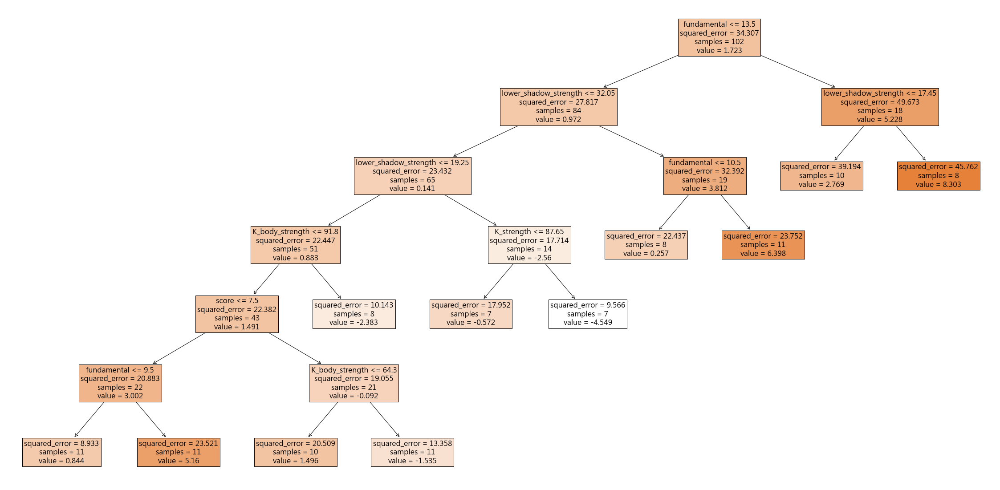

In [190]:
## plot the tree
from sklearn.tree import plot_tree
plt.figure(figsize=(40, 20))
plot_tree(model, filled=True, feature_names=X.columns)
plt.show()
